# Dataset Description
This dataset contains house sale prices for King County, which includes Seattle. It includes homes sold between May 2014 and May 2015.

The dataset is retrieved from Kaggle (https://www.kaggle.com/harlfoxem/housesalesprediction). It is published on 08/25/2016. The source is believed to be reliable because all housing information is public data. It is a famous dataset, and the features are complete.


## King County Housing Dataset - Column Descriptions

| Column Name        | Description  |
|--------------------|-------------|
| house_id          | Unique identifier for a house |
| date             | House was sold |
| price            | Is prediction target |
| bedroomsNumber   | # of bedrooms |
| bathroomsNumber  | # of bathrooms |
| sqft_livingsquare | Footage of the home |
| sqft_lotsquare   | Footage of the lot |
| floorsTotal      | Floors (levels) in house |
| waterfront       | House which has a view to a waterfront |
| view            | Quality of view |
| condition       | How good the condition is (Overall) |
| grade           | Overall grade given to the housing unit, based on King County grading system |
| sqft_above      | Square footage of house apart from basement |
| sqft_basement   | Square footage of the basement |
| yr_built        | Built Year |
| yr_renovated    | Year when house was renovated |
| zipcode         |  What zipcode area the house is in |
| lat             | Latitude coordinate |
| long            | Longitude coordinate |
| sqft_living15   | The square footage of interior housing living space for the nearest 15 neighbors |




Pandas, numpy, seaborn, matplotlib, and scipy are the five libraries loaded into the application.The libraries indicated above are essential tools for processing data, creating visualizations, and doing statistical analysis.

In [3]:
#importing the necessary libraries that we will be working with
import pandas as pd #pandas will help us with data manipulation and analysis
import numpy as np #numpy lets us quickly perform operations on numerical data
import seaborn as sns #seaborn is helpful with data visualization
import matplotlib.pyplot as plt #matplotlib will let us form useful plots
from scipy import stats #scipy provides statistical functions like t-tests
#command that lets us view matplotlib plots in the jupyter notebook
%matplotlib inline
import warnings
from folium.plugins import HeatMap
import folium

Data Loading and Initial Inspection

In [5]:
df = pd.read_csv(r"E:\New folder (2)\King House Price Prediction\kc_house_data.csv")
# Set display option for float format
pd.set_option('display.float_format', lambda x: '%.5f' % x)

To start the analysis process data first needs to load into DataFrame for processing.The second enhancement implements consistent five-decimal display for float values to maintain clear outputs without scientific notation or long 
decimal point expansions.

In [7]:
df.head(10)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.00000,3,1.00000,1180,5650,1.00000,0,0,...,7,1180,0,1955,0,98178,47.51120,-122.25700,1340,5650
1,6414100192,20141209T000000,538000.00000,3,2.25000,2570,7242,2.00000,0,0,...,7,2170,400,1951,1991,98125,47.72100,-122.31900,1690,7639
2,5631500400,20150225T000000,180000.00000,2,1.00000,770,10000,1.00000,0,0,...,6,770,0,1933,0,98028,47.73790,-122.23300,2720,8062
3,2487200875,20141209T000000,604000.00000,4,3.00000,1960,5000,1.00000,0,0,...,7,1050,910,1965,0,98136,47.52080,-122.39300,1360,5000
4,1954400510,20150218T000000,510000.00000,3,2.00000,1680,8080,1.00000,0,0,...,8,1680,0,1987,0,98074,47.61680,-122.04500,1800,7503
5,7237550310,20140512T000000,1225000.00000,4,4.50000,5420,101930,1.00000,0,0,...,11,3890,1530,2001,0,98053,47.65610,-122.00500,4760,101930
6,1321400060,20140627T000000,257500.00000,3,2.25000,1715,6819,2.00000,0,0,...,7,1715,0,1995,0,98003,47.30970,-122.32700,2238,6819
7,2008000270,20150115T000000,291850.00000,3,1.50000,1060,9711,1.00000,0,0,...,7,1060,0,1963,0,98198,47.40950,-122.31500,1650,9711
8,2414600126,20150415T000000,229500.00000,3,1.00000,1780,7470,1.00000,0,0,...,7,1050,730,1960,0,98146,47.51230,-122.33700,1780,8113
9,3793500160,20150312T000000,323000.00000,3,2.50000,1890,6560,2.00000,0,0,...,7,1890,0,2003,0,98038,47.36840,-122.03100,2390,7570


The first step shows the first 10 rows to display both the structure and features of the dataset.

In [9]:
df.shape #check shape (means how long and wide it is)

(21613, 21)

Dataset contains 21,613 house sale records from King County and 21 original columns with various house features

In [11]:
df.info() #to check data types and count of Non-Null values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

The df.info() function provides information about the database to verify presence of necessary parameters including float64, int64 and object variable types and non-null counts for determining dataset size along with data types.   The second stage of data preparation includes verifying data preservation and identifying potential data quality problems which include empty fields as well as incorrect data types.

















# Data Cleaning
Prepare the dataset by handling missing values, cleaning column names, converting data types, and removing unnecessary columns.

In [14]:
df.isnull().sum()  #to check there are missing values

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

confirms no missing values across all 21,613 entries

In [16]:
#remove empty spaces in column names
df.columns = df.columns.str.replace(' ', '')
df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')

Extra spaces are eliminated from column names.


In [18]:
# Convert date sold column to datetime 
df['date']=pd.to_datetime(df['date'])
df['date']

0       2014-10-13
1       2014-12-09
2       2015-02-25
3       2014-12-09
4       2015-02-18
           ...    
21608   2014-05-21
21609   2015-02-23
21610   2014-06-23
21611   2015-01-16
21612   2014-10-15
Name: date, Length: 21613, dtype: datetime64[ns]

Converting dates enables for the simple extraction of time-related characteristics.


In [20]:
# Count the number of duplicate rows
duplicate_count = df.duplicated().sum()
print(f"Number of duplicate rows: {duplicate_count}")

Number of duplicate rows: 0


There are no duplicate rows

In [22]:
# Check for Duplicates in house_id 
df.id.duplicated().value_counts()

id
False    21436
True       177
Name: count, dtype: int64

There are 177 duplicate ids suggesting some houses were sold multiple times.

In [24]:
# drop the columns 'id', of which one is the redundant unique house identifier and the other the id of house sales, which is not needed for analysis

df.drop('id', axis =1, inplace=True)
df.head(10)


,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,2014-10-13,221900.00000,3,1.00000,1180,5650,1.00000,0,0,3,7,1180,0,1955,0,98178,47.51120,-122.25700,1340,5650
1,2014-12-09,538000.00000,3,2.25000,2570,7242,2.00000,0,0,3,7,2170,400,1951,1991,98125,47.72100,-122.31900,1690,7639
2,2015-02-25,180000.00000,2,1.00000,770,10000,1.00000,0,0,3,6,770,0,1933,0,98028,47.73790,-122.23300,2720,8062
3,2014-12-09,604000.00000,4,3.00000,1960,5000,1.00000,0,0,5,7,1050,910,1965,0,98136,47.52080,-122.39300,1360,5000
4,2015-02-18,510000.00000,3,2.00000,1680,8080,1.00000,0,0,3,8,1680,0,1987,0,98074,47.61680,-122.04500,1800,7503
5,2014-05-12,1225000.00000,4,4.50000,5420,101930,1.00000,0,0,3,11,3890,1530,2001,0,98053,47.65610,-122.00500,4760,101930
6,2014-06-27,257500.00000,3,2.25000,1715,6819,2.00000,0,0,3,7,1715,0,1995,0,98003,47.30970,-122.32700,2238,6819
7,2015-01-15,291850.00000,3,1.50000,1060,9711,1.00000,0,0,3,7,1060,0,1963,0,98198,47.40950,-122.31500,1650,9711
8,2015-04-15,229500.00000,3,1.00000,1780,7470,1.00000,0,0,3,7,1050,730,1960,0,98146,47.51230,-122.33700,1780,8113
9,2015-03-12,323000.00000,3,2.50000,1890,6560,2.00000,0,0,3,7,1890,0,2003,0,98038,47.36840,-122.03100,2390,7570


Due to its duplication and lack of analytical value, the unique identification column ('id') is removed.


In [26]:
#Total Area: Sum of sqft_living and sqft_lot
df['total_area'] = df['sqft_living'] + df['sqft_lot']
df['total_area']

0         6830
1         9812
2        10770
3         6960
4         9760
         ...  
21608     2661
21609     8123
21610     2370
21611     3988
21612     2096
Name: total_area, Length: 21613, dtype: int64

In [27]:
# Price per Square Foot
df['price_per_sqft'] = df['price'] / df['sqft_living'].replace(0, np.nan)

In [28]:
# Extract only the year from the date
df['year_sold'] = df['date'].dt.year


In [29]:
# Calculate the house age at the time of sale
df['house_age_at_sale'] = df['year_sold'] - df['yr_built']


In [30]:
# Calculate the number of years from renovation to when the house was sold.
# If the house wasn't renovated (yr_renovated = 0), use the year it was built instead.
df['age_renovated'] = np.where(
    df['yr_renovated'] == 0,  # Check if no renovation happened
    df['year_sold'] - df['yr_built'],  # Use the built year if no renovation
    df['year_sold'] - df['yr_renovated']  # Use the renovation year if available
)

# Determine if the house was renovated or not (Yes/No)
df['done_reno'] = np.where(
    df['yr_renovated'] == 0,  # Check if no renovation happened
    "No",  # If no renovation, mark as 'No'
    "Yes"  # If renovated, mark as 'Yes'
)


In [31]:
# Condition: If waterfront is 1 → Yes (Has Waterfront), else No
df['has_waterfront'] = np.where(df['waterfront'] == 1, 'Yes', 'No')
# Condition: If view is greater than 0 → Yes (Has a View), else No
df['has_view'] = np.where(df['view'] > 0, 'Yes', 'No')

In [32]:
df.head(10)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_living15,sqft_lot15,total_area,price_per_sqft,year_sold,house_age_at_sale,age_renovated,done_reno,has_waterfront,has_view
0,2014-10-13,221900.00000,3,1.00000,1180,5650,1.00000,0,0,3,...,1340,5650,6830,188.05085,2014,59,59,No,No,No
1,2014-12-09,538000.00000,3,2.25000,2570,7242,2.00000,0,0,3,...,1690,7639,9812,209.33852,2014,63,23,Yes,No,No
2,2015-02-25,180000.00000,2,1.00000,770,10000,1.00000,0,0,3,...,2720,8062,10770,233.76623,2015,82,82,No,No,No
3,2014-12-09,604000.00000,4,3.00000,1960,5000,1.00000,0,0,5,...,1360,5000,6960,308.16327,2014,49,49,No,No,No
4,2015-02-18,510000.00000,3,2.00000,1680,8080,1.00000,0,0,3,...,1800,7503,9760,303.57143,2015,28,28,No,No,No
5,2014-05-12,1225000.00000,4,4.50000,5420,101930,1.00000,0,0,3,...,4760,101930,107350,226.01476,2014,13,13,No,No,No
6,2014-06-27,257500.00000,3,2.25000,1715,6819,2.00000,0,0,3,...,2238,6819,8534,150.14577,2014,19,19,No,No,No
7,2015-01-15,291850.00000,3,1.50000,1060,9711,1.00000,0,0,3,...,1650,9711,10771,275.33019,2015,52,52,No,No,No
8,2015-04-15,229500.00000,3,1.00000,1780,7470,1.00000,0,0,3,...,1780,8113,9250,128.93258,2015,55,55,No,No,No
9,2015-03-12,323000.00000,3,2.50000,1890,6560,2.00000,0,0,3,...,2390,7570,8450,170.89947,2015,12,12,No,No,No


In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 28 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   date               21613 non-null  datetime64[ns]
 1   price              21613 non-null  float64       
 2   bedrooms           21613 non-null  int64         
 3   bathrooms          21613 non-null  float64       
 4   sqft_living        21613 non-null  int64         
 5   sqft_lot           21613 non-null  int64         
 6   floors             21613 non-null  float64       
 7   waterfront         21613 non-null  int64         
 8   view               21613 non-null  int64         
 9   condition          21613 non-null  int64         
 10  grade              21613 non-null  int64         
 11  sqft_above         21613 non-null  int64         
 12  sqft_basement      21613 non-null  int64         
 13  yr_built           21613 non-null  int64         
 14  yr_ren

The addition of four new columns consisting of total_area from combining living area and lot size along with price_per_sqft, year_sold, house_age_at_sale, and age_renovated occurs. The added features in the dataset include the binary indicators done_reno, has_waterfront, and has_view.



















#### Identify and handle outliers using IQR method

Boxplots are created for multiple numerical variables (like price, sqft_living, etc.), visually highlighting the presence of outliers.

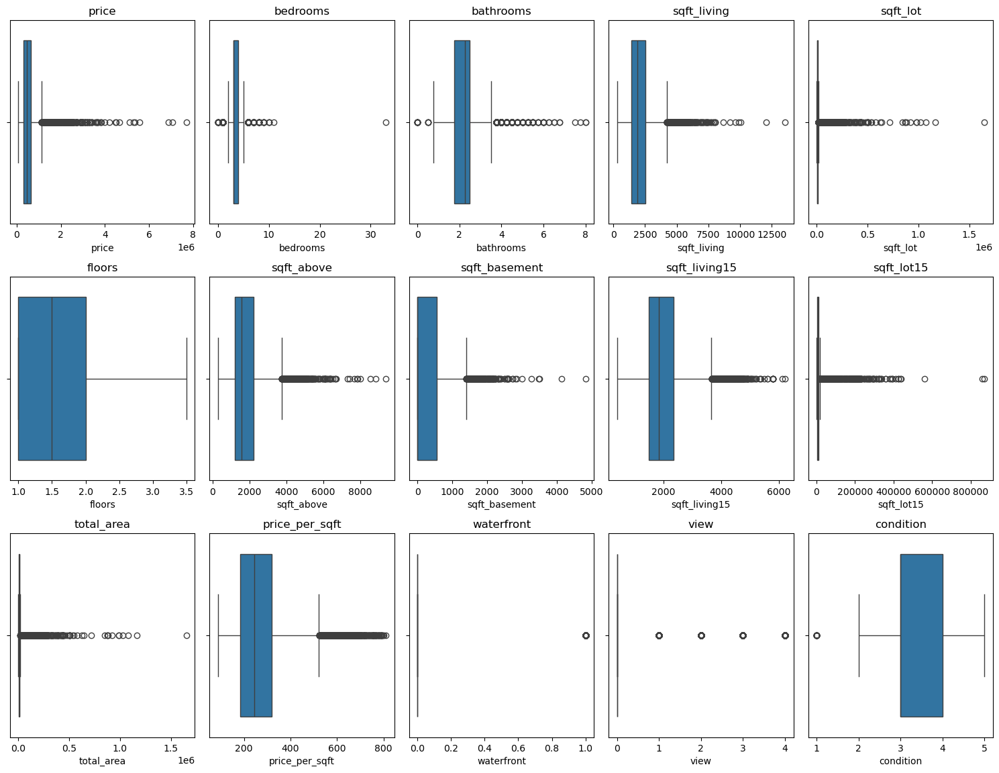

In [37]:
# List of columns to visualize
outlier_cols = ['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
                'floors', 'sqft_above', 'sqft_basement', 'sqft_living15', 'sqft_lot15',
                'total_area', 'price_per_sqft', 'waterfront', 'view','condition']

plt.figure(figsize=(15, 15))
x = 1

for column in outlier_cols:
    plt.subplot(4, 5, x)
    sns.boxplot(x=df[column]) 
    plt.title(column)
    x += 1

plt.tight_layout()
plt.show()


Price, sqft_living, sqft_lot, and other feature boxplots show a broad range of values with a number of extreme observations.
Outlier treatment may be necessary for some characteristics (like price and sqft_lot) that have lengthy whiskers and obvious outliers.


In [39]:
def whisker(col):
    # Compute Q1 (25th percentile) and Q3 (75th percentile)
    q1, q3 = np.percentile(col, [25, 75])

    # Compute IQR (Interquartile Range)
    iqr = q3 - q1

    # Compute lower and upper whisker
    lw = q1 - 1.5 * iqr
    uw = q3 + 1.5 * iqr

    return lw, uw  # Return lower and upper bounds

In [40]:
# List of columns to check
cols_to_check = ['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
                 'sqft_above', 'sqft_basement', 'sqft_living15', 'sqft_lot15',
                 'total_area', 'price_per_sqft']

# Apply the whisker function to each column
for col in cols_to_check:
    lw, uw = whisker(df[col])  # Get the lower and upper whisker values
    df[col] = np.where(df[col] < lw, lw, df[col])  # Replace values lower than lower whisker
    df[col] = np.where(df[col] > uw, uw, df[col])  # Replace values greater than upper whisker

The interquartile range (IQR) is calculated for each variable. Any value below Q1 – 1.5×IQR or above Q3 + 1.5×IQR is replaced by the respective whisker boundary. This method helps in reducing the influence of extreme values on the analysis without completely removing data points, preserving overall trends 

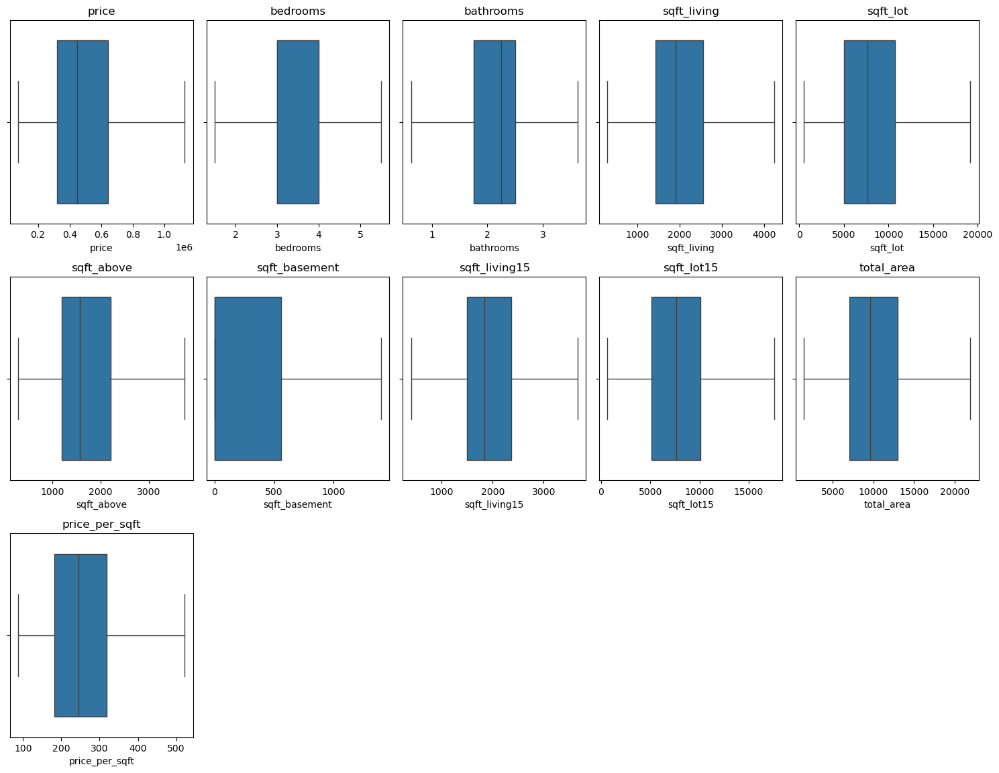

In [42]:
# List of columns to visualize
remove_outlier_cols = ['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
                'sqft_above', 'sqft_basement', 'sqft_living15', 'sqft_lot15',
                'total_area', 'price_per_sqft']

plt.figure(figsize=(15, 15))
x = 1

for column in remove_outlier_cols:
    plt.subplot(4, 5, x)
    sns.boxplot(x=df[column]) 
    plt.title(column)
    x += 1

plt.tight_layout()
plt.show()


After using the IQR approach, the boxplots have compressed whiskers, indicating that extreme values have been substituted with calculated bounds.
The distributions now appear more controlled, which helps to reduce the excessive effect of outliers on future analysis.


# Data Exploratory Data Analysis

In [45]:
##summary statistics for all numerical features
df.describe(include=["number"]).T


,count,mean,std,min,25%,50%,75%,max
price,21613.00000,511587.28210,250002.62357,75000.00000,321950.00000,450000.00000,645000.00000,1129575.00000
bedrooms,21613.00000,3.36279,0.85411,1.50000,3.00000,3.00000,4.00000,5.50000
bathrooms,21613.00000,2.09848,0.72203,0.62500,1.75000,2.25000,2.50000,3.62500
sqft_living,21613.00000,2058.07856,839.30781,290.00000,1427.00000,1910.00000,2550.00000,4234.50000
sqft_lot,21613.00000,8705.22445,5046.48207,520.00000,5040.00000,7618.00000,10688.00000,19160.00000
floors,21613.00000,1.49431,0.53999,1.00000,1.00000,1.50000,2.00000,3.50000
waterfront,21613.00000,0.00754,0.08652,0.00000,0.00000,0.00000,0.00000,1.00000
view,21613.00000,0.23430,0.76632,0.00000,0.00000,0.00000,0.00000,4.00000
condition,21613.00000,3.40943,0.65074,1.00000,3.00000,3.00000,4.00000,5.00000
grade,21613.00000,7.65687,1.17546,1.00000,7.00000,7.00000,8.00000,13.00000


The descriptive statistics (mean, median, standard deviation) provide insights into the central tendencies and variability for each numerical feature.

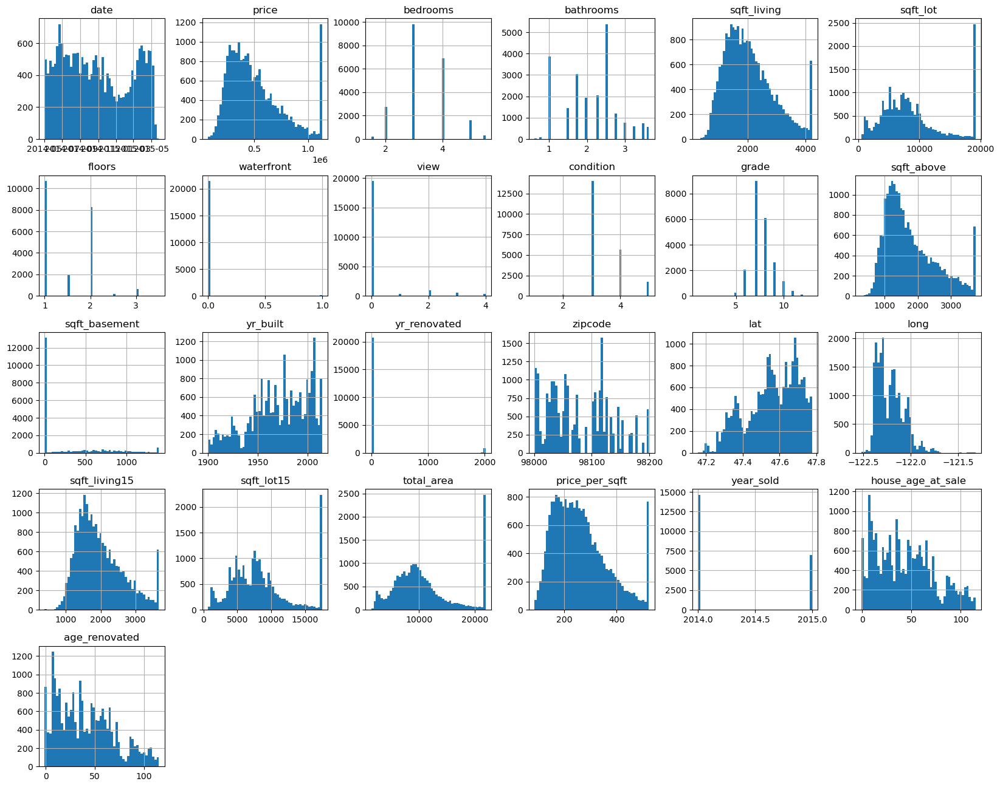

In [47]:
#Displaying histograms for each variable
df.hist(bins=50, figsize=(20,16), layout=(5, 6))
plt.show()

Several features demonstrate right skewness in distribution patterns according to the histogram analysis especially of the target 'price' characteristic. The examination provides fundamental information about data spread patterns before modification procedures take effect.


##### Target: Price
During the EDA step, we evaluated both the target property and all of the features present in the dataset.  The project's target variable will be 'price', with the other fields serving as data features.

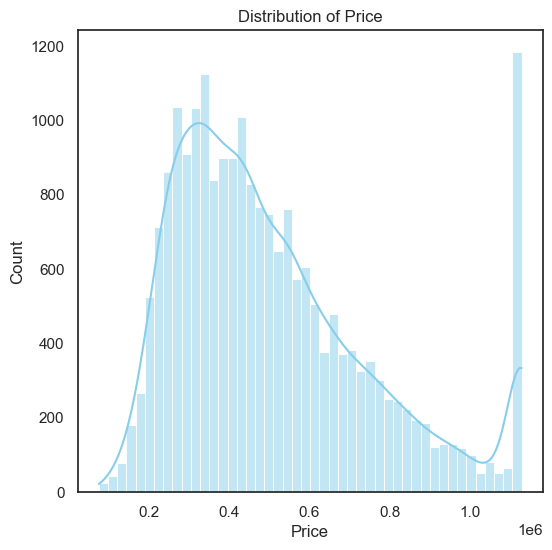

In [50]:
#Since price is our target, we will explore first
#view distribution of price using histogram
sns.set(style = 'white')
fig, ax = plt.subplots(figsize = (6,6))
sns.histplot(data = df, x = 'price', color='skyblue',kde=True )
ax.set_xlabel('Price')
ax.set_ylabel('Count')
ax.set_title('Distribution of Price')
plt.show()

The histogram shows that the price data is skewed to the right, indicating a non-normal distribution. The histogram demonstrates that property prices show strong right-skewed distribution because the majority of properties fall within lower price brackets while high-value properties extend into an extended tail.Raw property prices do not match normal distribution patterns because the KDE line highlights that the distribution pattern is skewed.



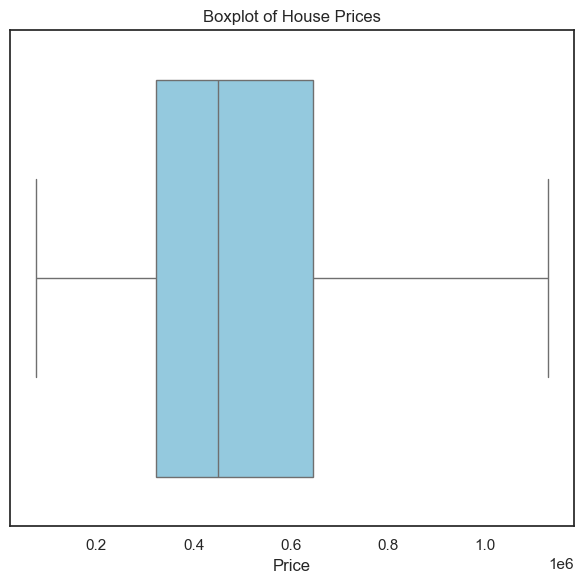

In [52]:
# Plot a boxplot to check the distribution and outliers of house prices

sns.set(style='white')
fig, ax = plt.subplots(figsize=(6, 6))

sns.boxplot(data=df, x='price', color='skyblue')  

ax.set_xlabel('Price')
ax.set_title('Boxplot of House Prices')

plt.tight_layout()
plt.show()


The boxplot reveals that some extreme price values exist at the highest end of the price range. The graphical presentation demonstrates skewness by extending its upper whisker more than its lower whisker can be observed.




In [54]:
#Because the data is skewed to the right, transform the price data using log
df['ln_price'] = np.log(df['price'])

The pricing data was log-transformed (base of e) in order to normalize it.  The log-transformed data seems more like a normal distribution than the untransformed pricing data, as can be seen in the histogram below.

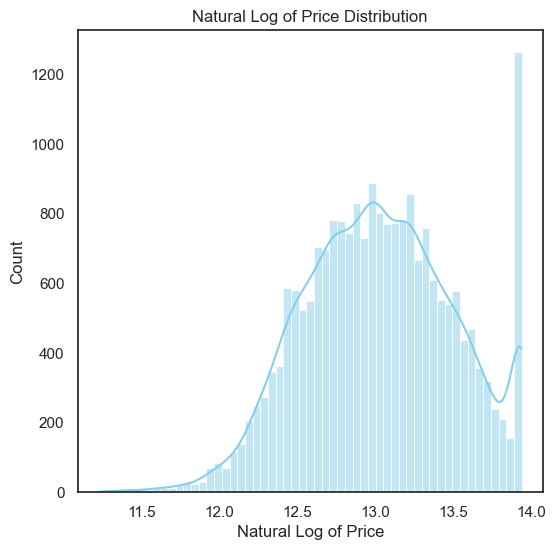

In [56]:
#view distribution of log base e for price using histogram
sns.set(style = 'white')
fig, ax = plt.subplots(figsize = (6,6))
sns.histplot(data = df, x = 'ln_price', color='skyblue',kde=True )
ax.set_xlabel('Natural Log of Price')
ax.set_ylabel('Count')
ax.set_title('Natural Log of Price Distribution')
plt.show()

The price variable becomes more bell-shaped and symmetrical after the natural log transformation is applied to it. The distribution achieved better normality after performing log transformation which reduced high-price outlier effects.





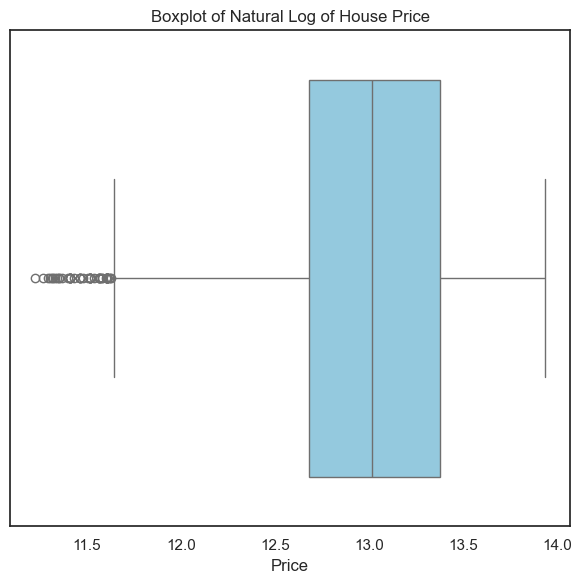

In [58]:
sns.set(style='white')
fig, ax = plt.subplots(figsize=(6, 6))

sns.boxplot(data=df, x='ln_price', color='skyblue')  

ax.set_xlabel('Price')
ax.set_title('Boxplot of Natural Log of House Price')

plt.tight_layout()
plt.show()

A log-transformed pricing boxplot shows reduced effects of outliers and presents a narrower range between its interquartile values. The transformation reduced the spread which shows that data points have achieved stability throughout the entire distribution.





## Create data visualizations to determine relationships between features and target variables.

In [61]:
categorical_features = ['condition','grade','view','floors','bedrooms','bathrooms','waterfront','zipcode','year_sold','done_reno','has_waterfront','has_view']
numerical_features=list(set(df.columns)  - set(categorical_features))

In [62]:
# Boxenplot: Show how a categorical feature influences the price
def categorical_vs_target(df, feature):
    plt.figure(figsize=(10, 6))
    sns.boxenplot(data=df, x=feature, y='price', palette='Set2')
    plt.title(f'{feature} vs Price', fontsize=18)
    plt.xlabel(feature.capitalize())
    plt.ylabel('Price')
    plt.grid(True)
    plt.show()

# Countplot: Show how many entries exist for each category
def categorical_countplot(df, feature):
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=feature, palette='pastel')
    plt.title(f'{feature} Count', fontsize=18)
    plt.xlabel(feature.capitalize())
    plt.ylabel('Count')
    plt.grid(True)
    plt.show()

# KDE Plot: Show the distribution of a numerical feature
def numerical_distplot(df, feature):
    plt.figure(figsize=(10, 6))
    sns.kdeplot(df[feature], fill=True, color='teal')
    plt.title(f'Distribution of {feature}', fontsize=18)
    plt.xlabel(feature.capitalize())
    plt.ylabel('Density')
    plt.grid(True)
    plt.show()

# Scatterplot: Show how a numerical feature relates to the price
def numerical_target_scatterplot(df, feature):
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=df, x=feature, y='price',color='steelblue')
    plt.title(f'{feature} vs Price', fontsize=18)
    plt.xlabel(feature.capitalize())
    plt.ylabel('Price')
    plt.grid(True)
    plt.show()


Categorical Analysis: Boxplots together with count plots help to analyze categorical factors such as bedrooms, bathrooms, floors, condition, grade, zipcode and renovation status that impact the target variable.  The visual displays enable users to spot recurring patterns by showing which factors contain more observations and what category holds higher median price values.

Numerical Relationships: The KDE plot together with scatter plots demonstrate the relationship between numerical characteristics like sqft_living and sqft_lot and the house pricing distribution.  The graphical representation of Scatterplots makes it possible to detect linear as well as non-linear relationships which exist between continuous features and the target.












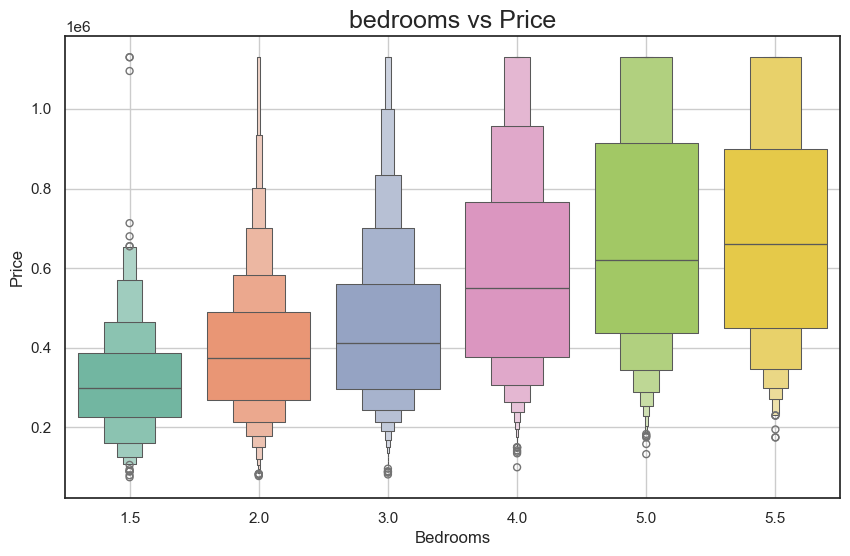

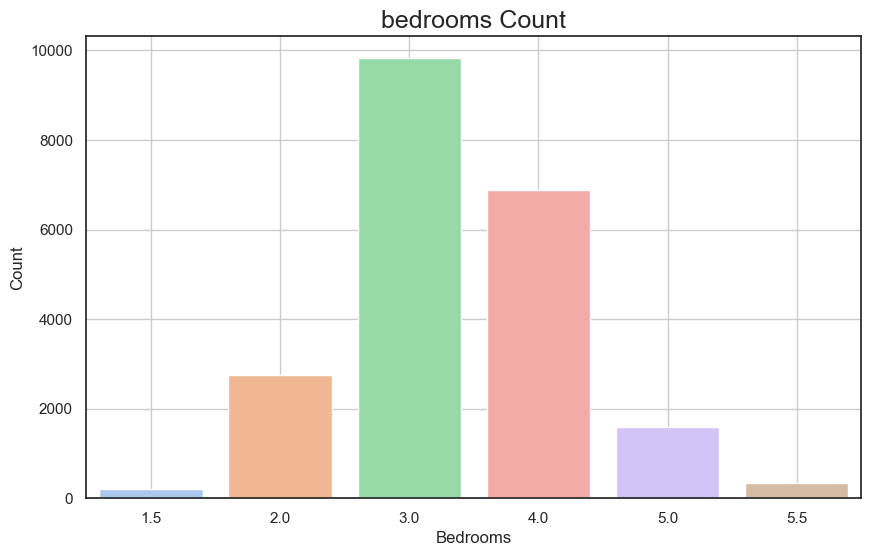

In [64]:
# Visualize relationships for categorical feature bedrooms
warnings.filterwarnings('ignore')
categorical_vs_target(df, 'bedrooms')  # Boxen plot for categorical feature vs price
categorical_countplot(df, 'bedrooms')  # Countplot to show counts of each category


The boxplot indicates that median house prices increase when homes contain more bedrooms but this change occurs with significant price differences between each bedroom category.
The countplot indicates three bedrooms as the most frequent property type, based on the available samples.


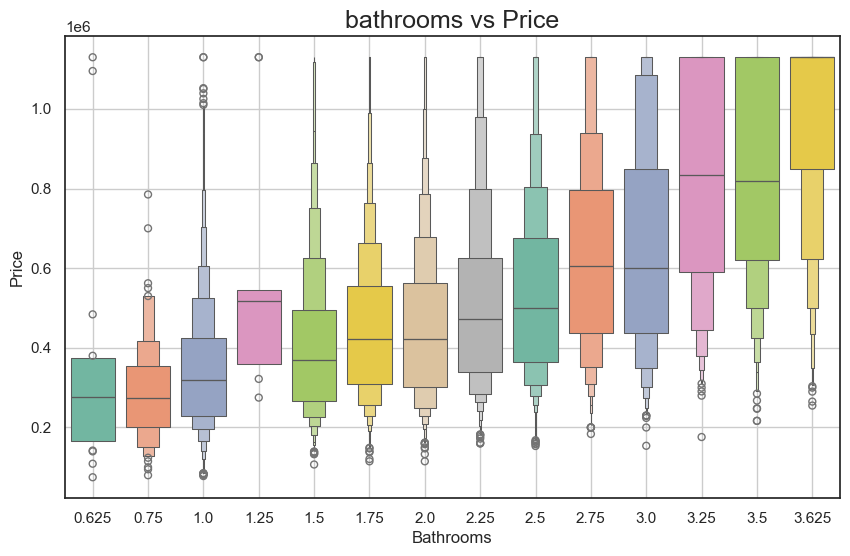

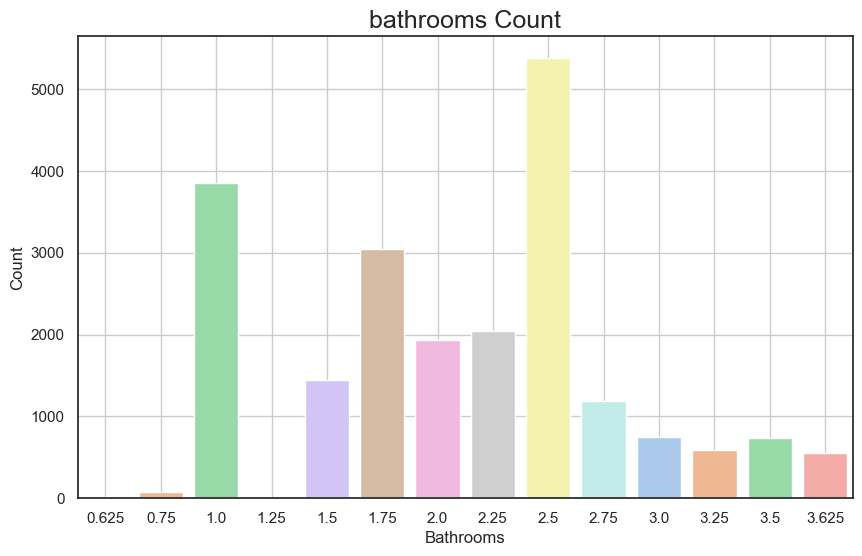

In [66]:
# Visualize relationships for categorical feature bathrooms
warnings.filterwarnings('ignore')
categorical_vs_target(df, 'bathrooms')  # Boxen plot for categorical feature vs price
categorical_countplot(df, 'bathrooms')  # Countplot to show counts of each category


Similar to bedrooms the boxplot reveals that bathroom prices rise with each additional bathroom. The countplot indicates that houses with 2-2.5 bathrooms represent the highest occurrence.






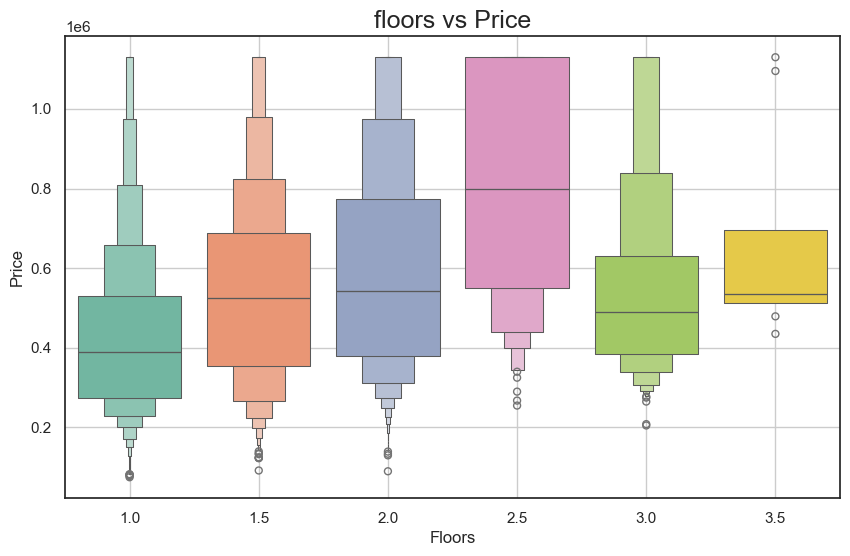

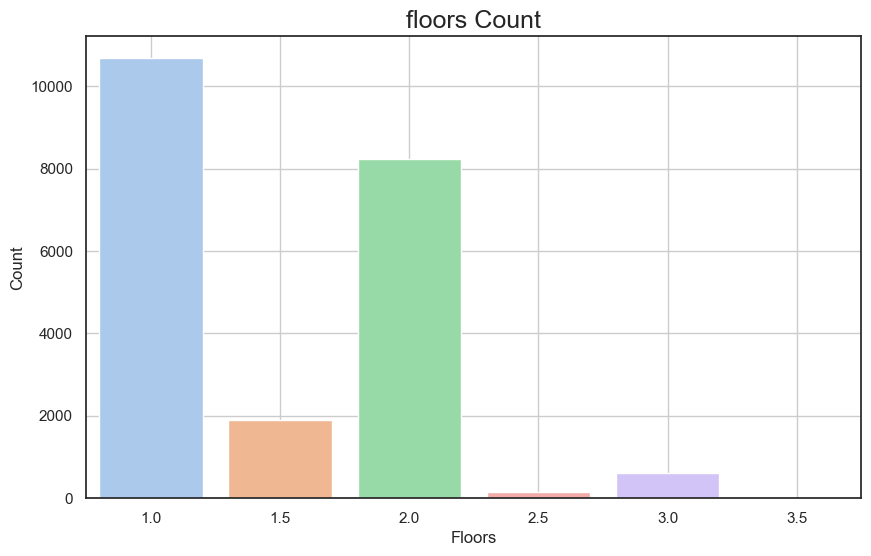

In [68]:
# Visualize relationships for categorical feature floors
warnings.filterwarnings('ignore')
categorical_vs_target(df, 'floors')  # Boxen plot for categorical feature vs price
categorical_countplot(df, 'floors')  # Countplot to show counts of each category


The boxplot analysis of floors indicates properties having multiple storeys tend to have higher median house values compared to those with fewer floors.Most homes in the sample include one story or two stories according to the countplot.

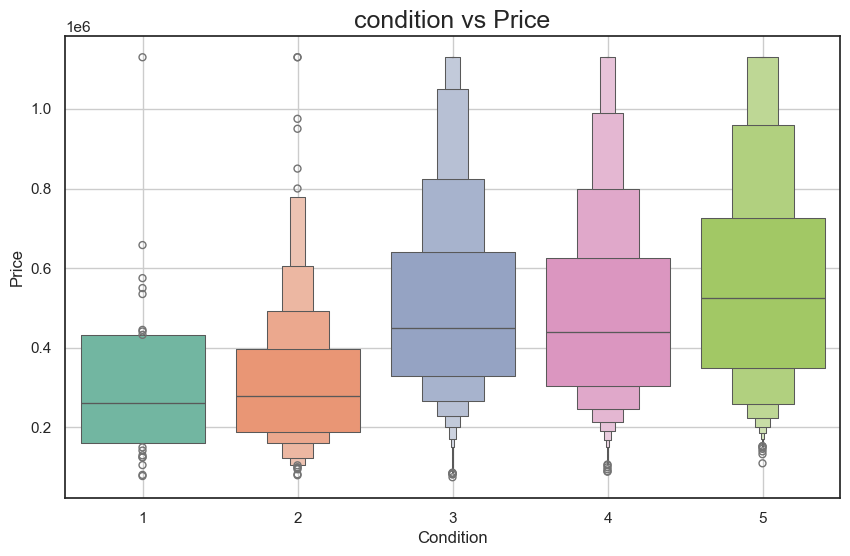

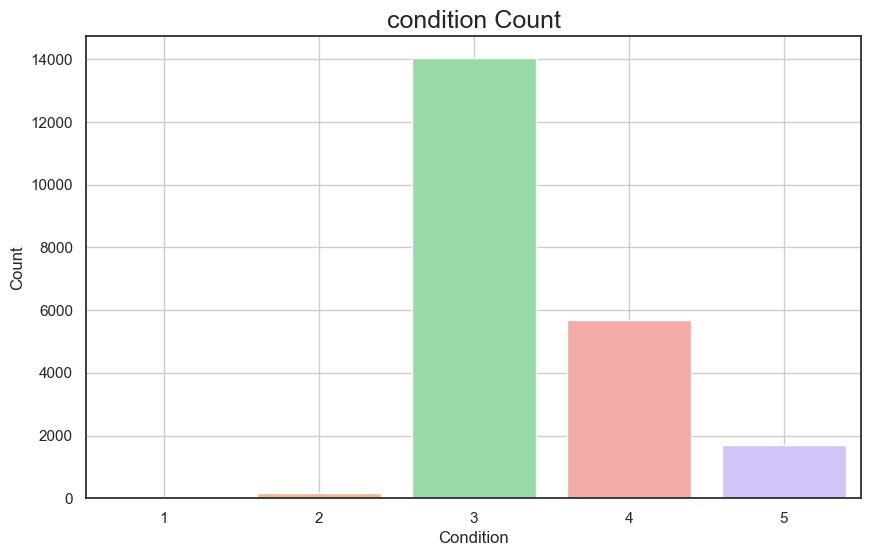

In [70]:
# Visualize relationships for categorical feature condition
warnings.filterwarnings('ignore')
categorical_vs_target(df, 'condition')  # Boxen plot for categorical feature vs price
categorical_countplot(df, 'condition')  # Countplot to show counts of each category


Better condition properties receive higher prices based on analysis from the boxplot visualization.
The middle conditions appear most frequently according to the countplot data.








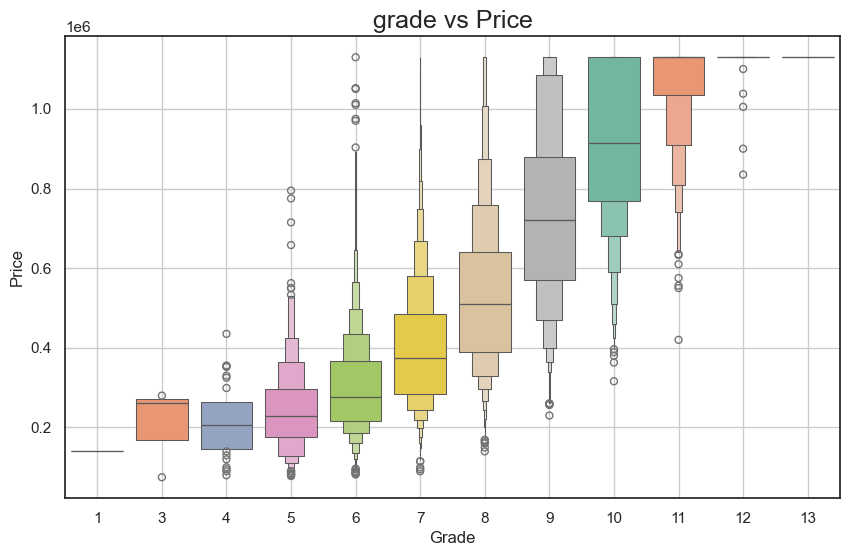

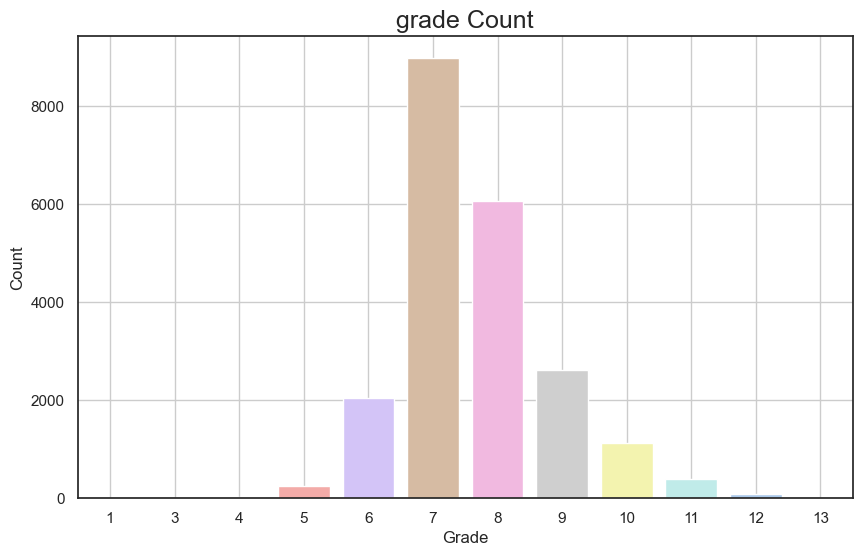

In [72]:
# Visualize relationships for categorical feature grade
warnings.filterwarnings('ignore')
categorical_vs_target(df, 'grade')  # Boxen plot for categorical feature vs price
categorical_countplot(df, 'grade')  # Countplot to show counts of each category


The grade box plot indicates a strong positive relationship because homes with better grades cause substantial cost increases.
The majority of analyzed properties belong to the mid-grade bracket according to the countplot results which follows typical market trends.








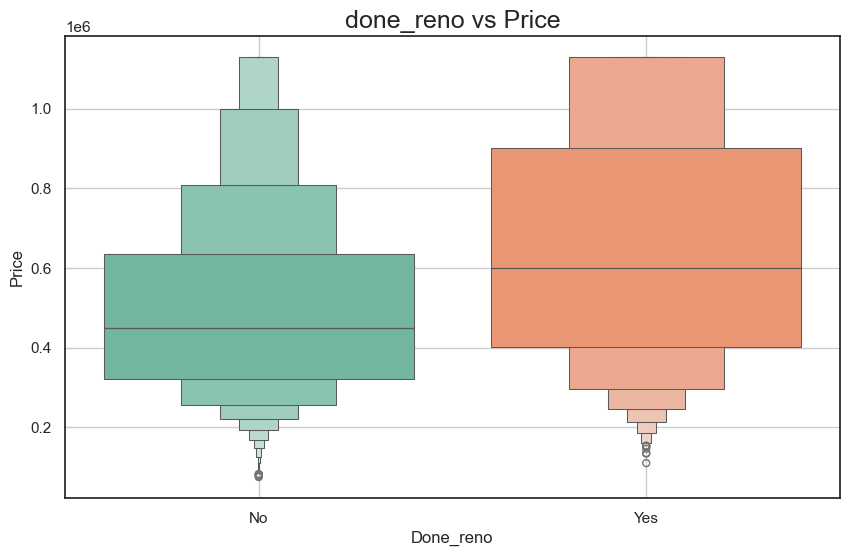

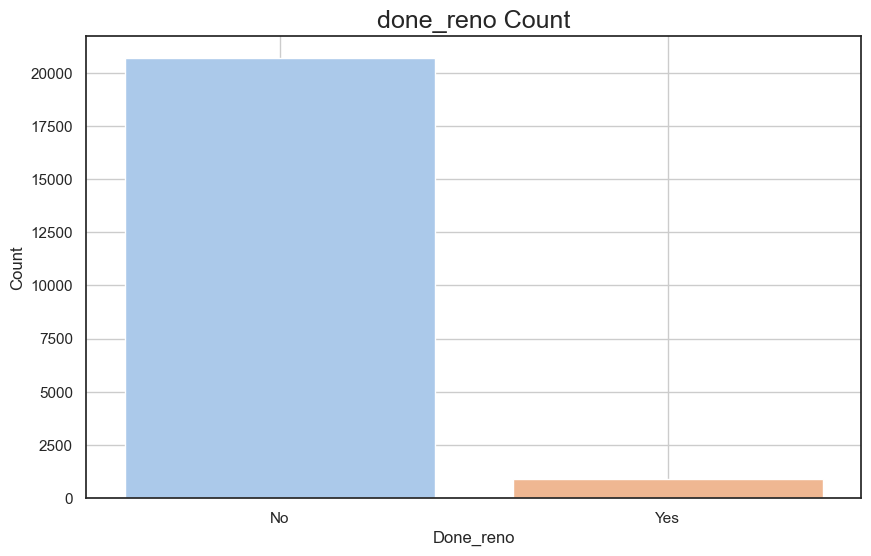

In [74]:
# Visualize relationships for categorical feature done_reno
warnings.filterwarnings('ignore')
categorical_vs_target(df, 'done_reno')  # Boxen plot for categorical feature vs price
categorical_countplot(df, 'done_reno')  # Countplot to show counts of each category


The distribution of prices between renovated and non-renovated houses shows a gap in pricing according to the boxplot results.   The analysis indicates that most houses in the area lacked renovation resulting in possible price changes throughout the market.








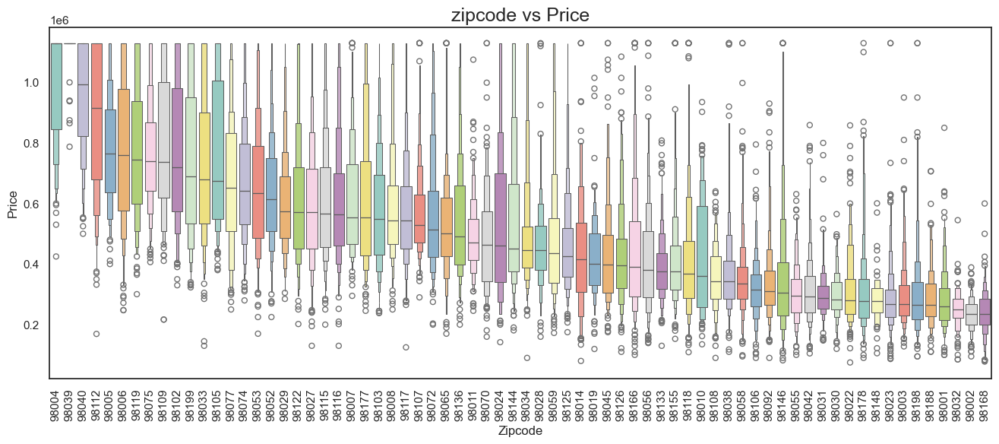

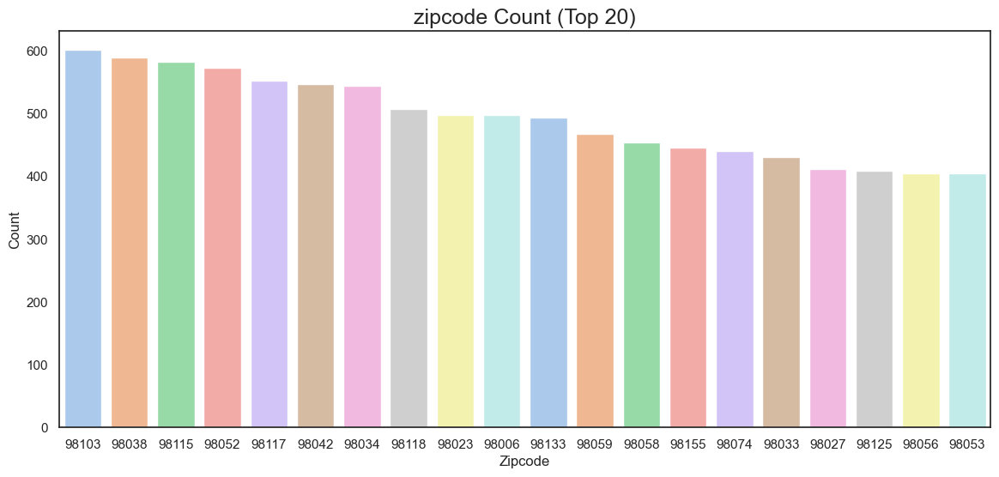

In [76]:
# Sort zipcodes by median price to make the boxen plot readable
def categorical_vs_target(df, feature):
    order = df.groupby(feature)['price'].median().sort_values(ascending=False).index
    plt.figure(figsize=(16, 6))
    sns.boxenplot(data=df, x=feature, y='price', order=order, palette='Set3')
    plt.title(f'{feature} vs Price', fontsize=18)
    plt.xlabel(feature.capitalize())
    plt.ylabel('Price')
    plt.xticks(rotation=90) # Rotate x-axis labels by 90 degrees
    plt.show()

# For countplot, only show top 20 zipcodes by frequency
def categorical_countplot(df, feature):
    top_vals = df[feature].value_counts().nlargest(20).index
    df_top = df[df[feature].isin(top_vals)]
    plt.figure(figsize=(14, 6))
    sns.countplot(data=df_top, x=feature, palette='pastel', order=top_vals)
    plt.title(f'{feature} Count (Top 20)', fontsize=18)
    plt.xlabel(feature.capitalize())
    plt.ylabel('Count')
    plt.show()

# Call the functions
categorical_vs_target(df, 'zipcode')
categorical_countplot(df, 'zipcode')

The visualization of zipcodes with their median price values through a box plot representation shows what price differences exist between areas.  The price levels in selected zipcodes exceed the median numbers in other areas. The information exposes differences between local markets and area conditions.
The countplot shows which places among the top twenty zip codes receive the most consumer activity.  The illustration functions to monitor market activities and customer behavior patterns in specific parts of King County.






















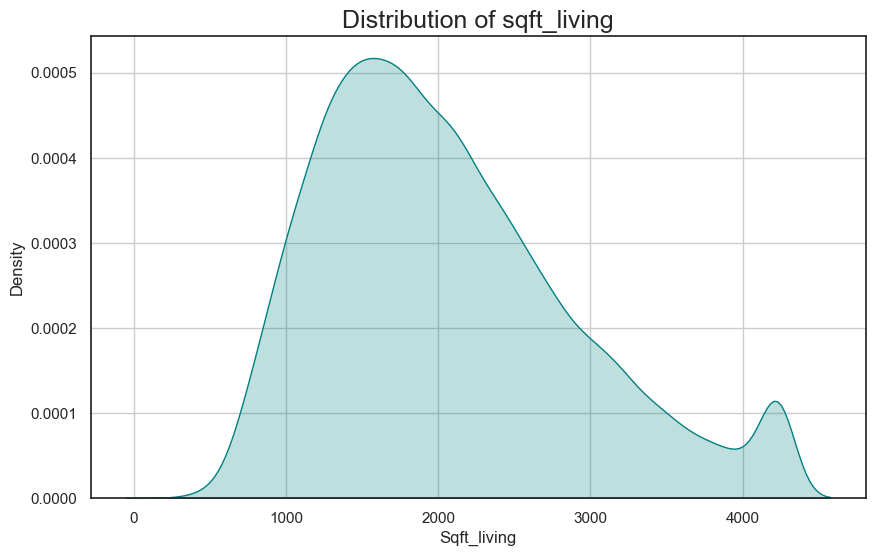

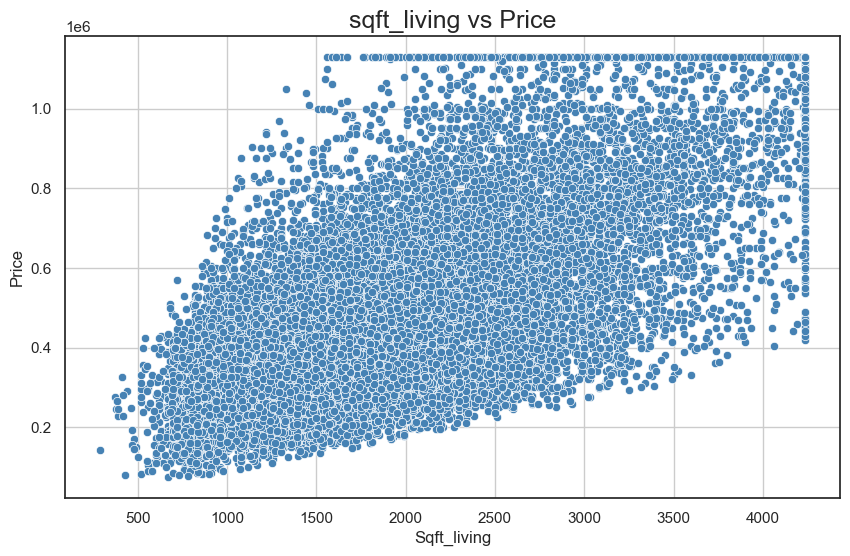

In [78]:
# Numerical
numerical_distplot(df, 'sqft_living')
numerical_target_scatterplot(df, 'sqft_living')

The KDE graph of sqft_living shows a one-peaked distribution that spreads moderately.
 The scatterplot demonstrates a strong positive relationship between living area size and house prices which exhibits some fluctuations.
























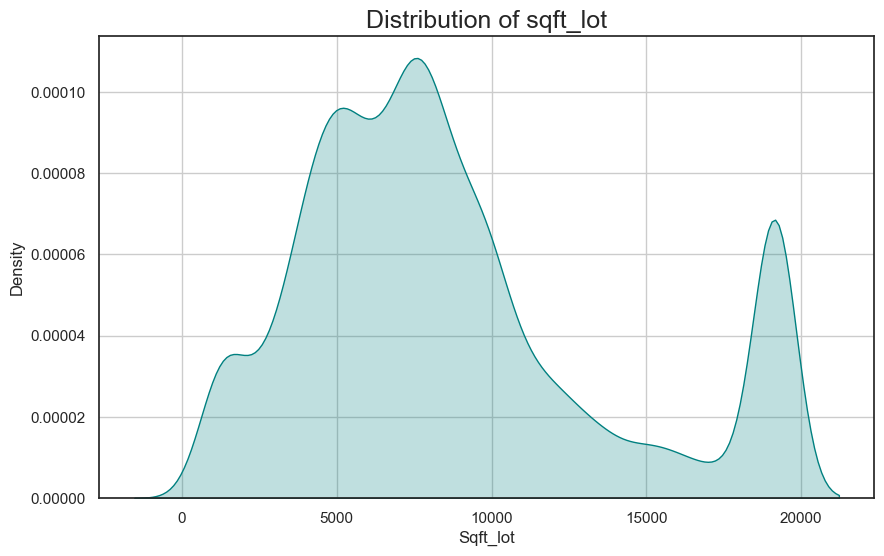

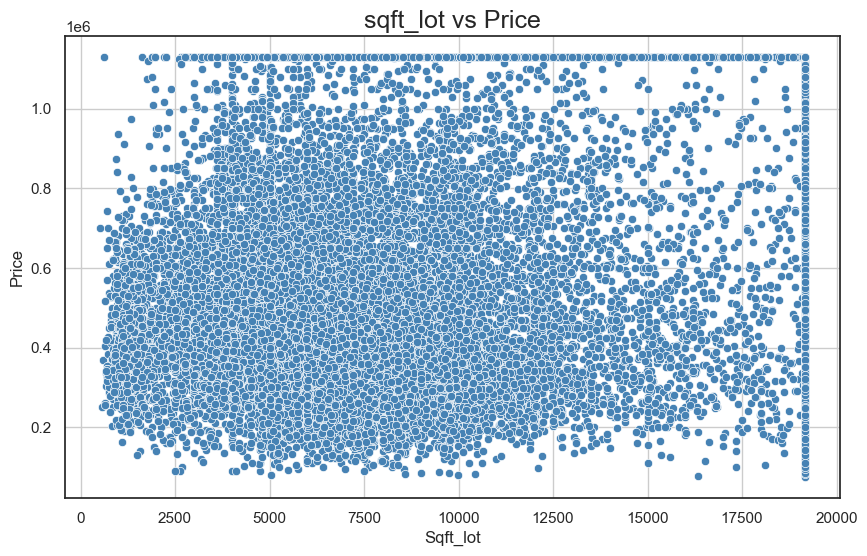

In [80]:
# Numerical
numerical_distplot(df, 'sqft_lot')
numerical_target_scatterplot(df, 'sqft_lot')

The distribution range of sqft_lot spreads further compared to the distribution range of living area. A positive relationship appears in the scatterplot between property lot size and price thus showing other elements that may affect market value.































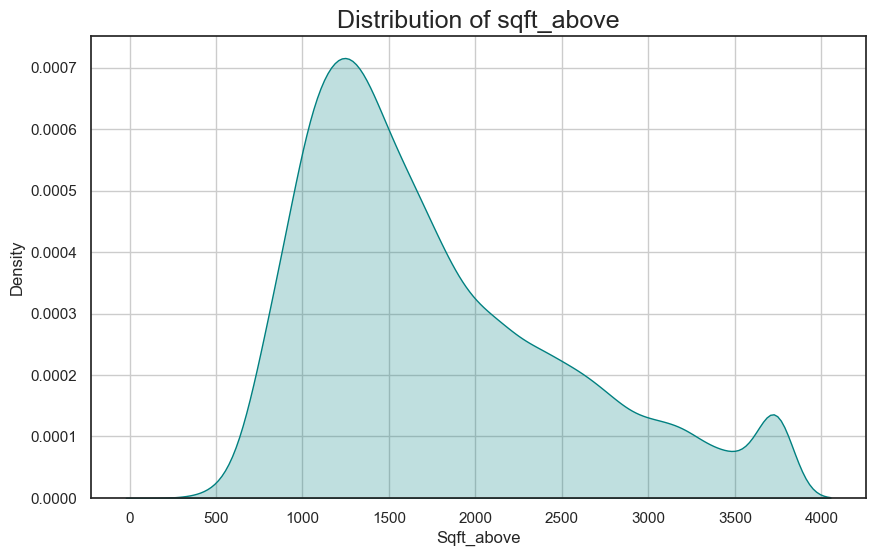

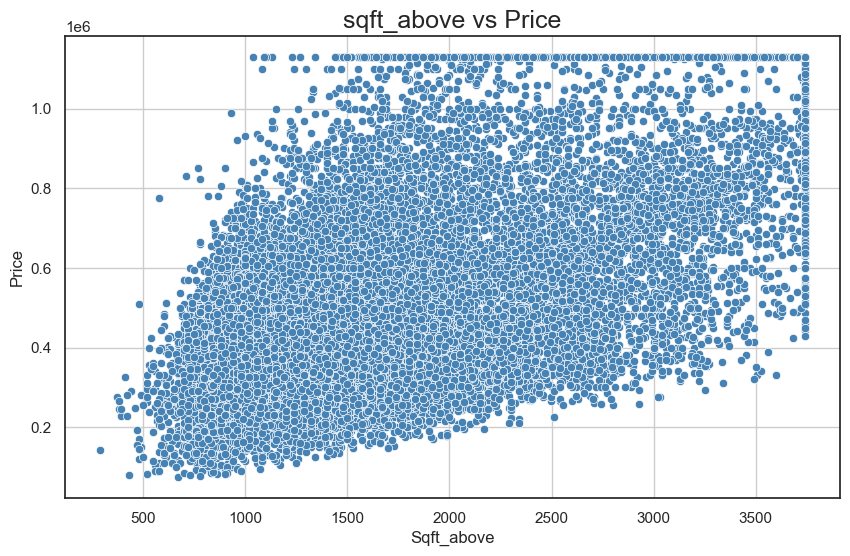

In [82]:
# Numerical
numerical_distplot(df, 'sqft_above')
numerical_target_scatterplot(df, 'sqft_above')

The density plot shows a central distribution with average spread together with the scatterplot confirming that better above-floor space corresponds to higher house prices.







































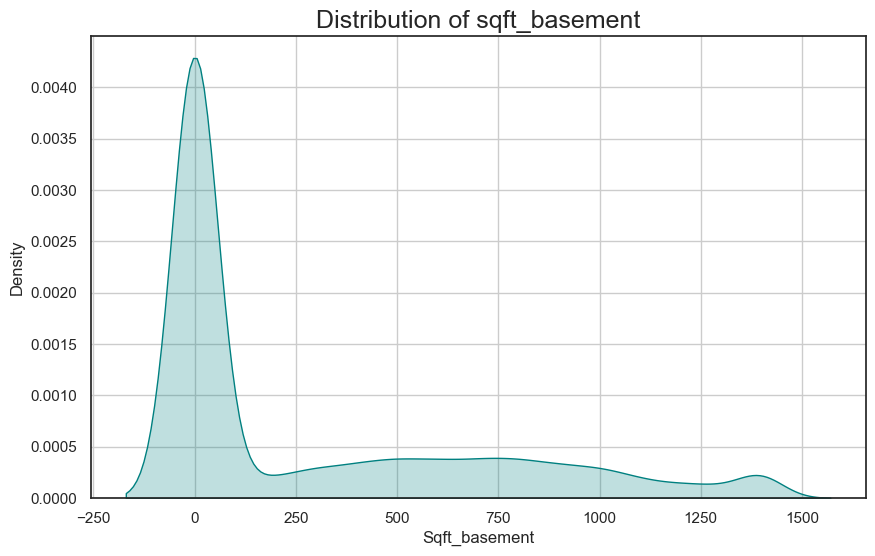

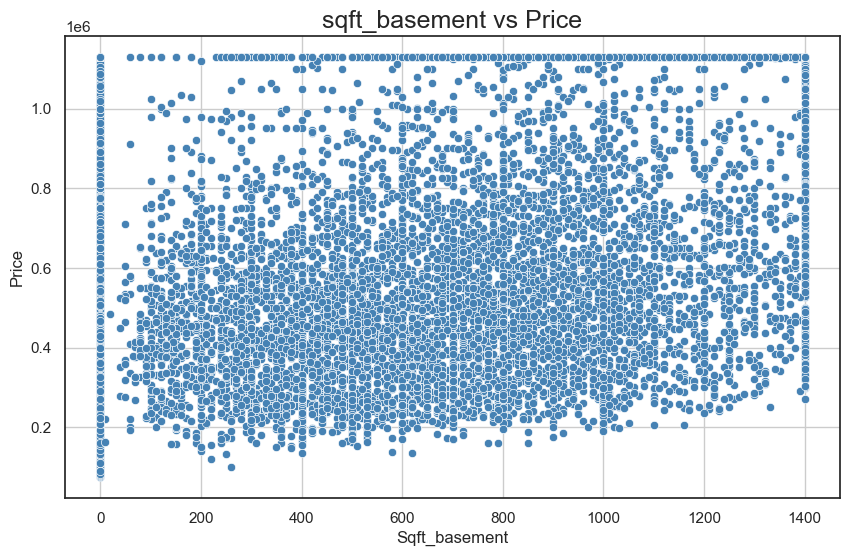

In [84]:
# Numerical
numerical_distplot(df, 'sqft_basement')
numerical_target_scatterplot(df, 'sqft_basement')

Most properties exhibit little or no basement area according to the sqft_basement distribution. The scatterplot shows weak correlation between basement area size and house price which suggests that basement area cannot be used as a dependable price predictor.















































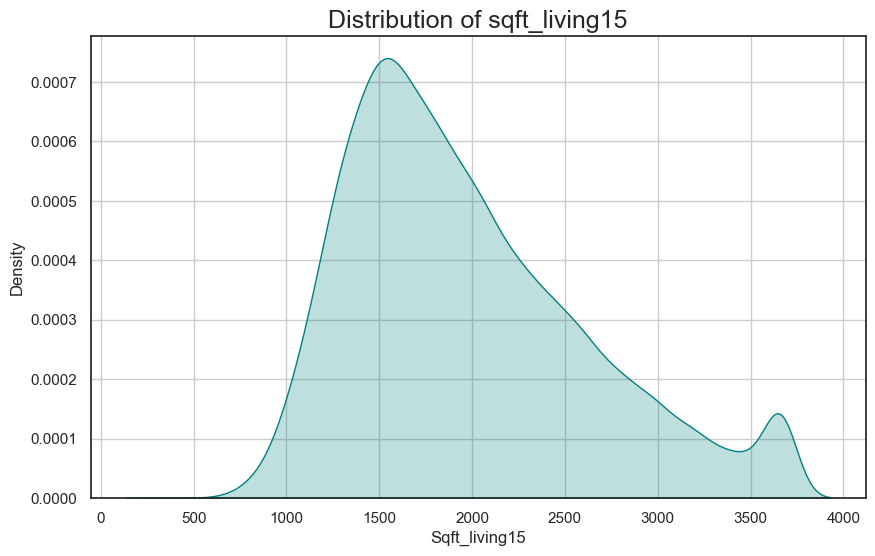

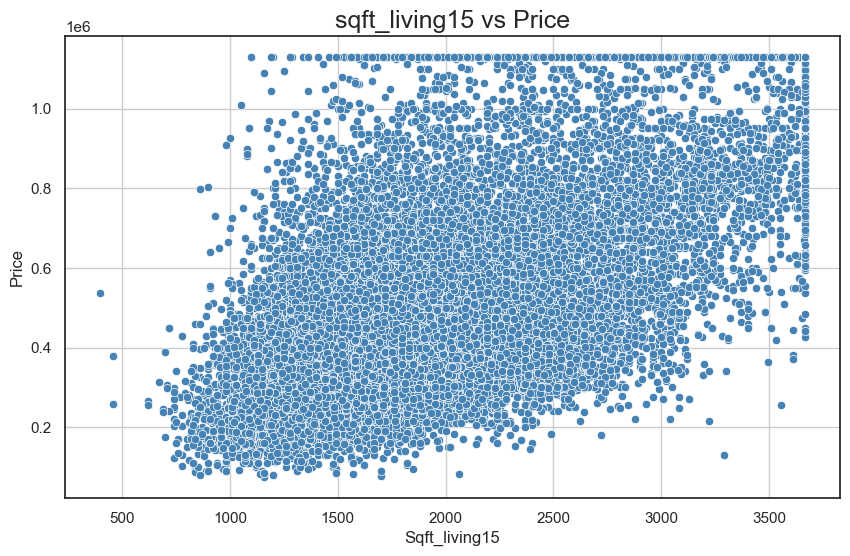

In [86]:
# Numerical
numerical_distplot(df, 'sqft_living15')
numerical_target_scatterplot(df, 'sqft_living15')

The distribution pattern of sqft_living15 in the KDE plot resembles normality when analyzing nearby property sizes.
The statistical pattern in the scatterplot indicates that properties situated within areas with extended neighboring housing areas tend to have greater selling values.














































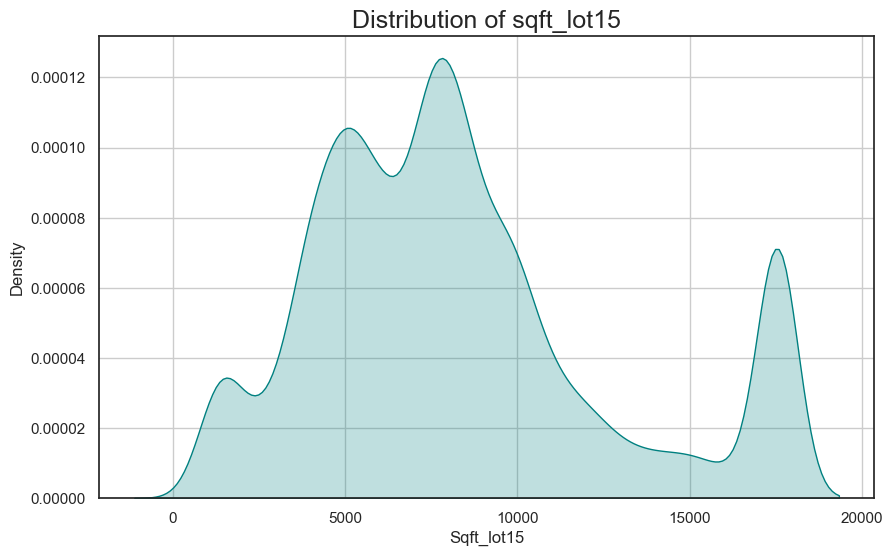

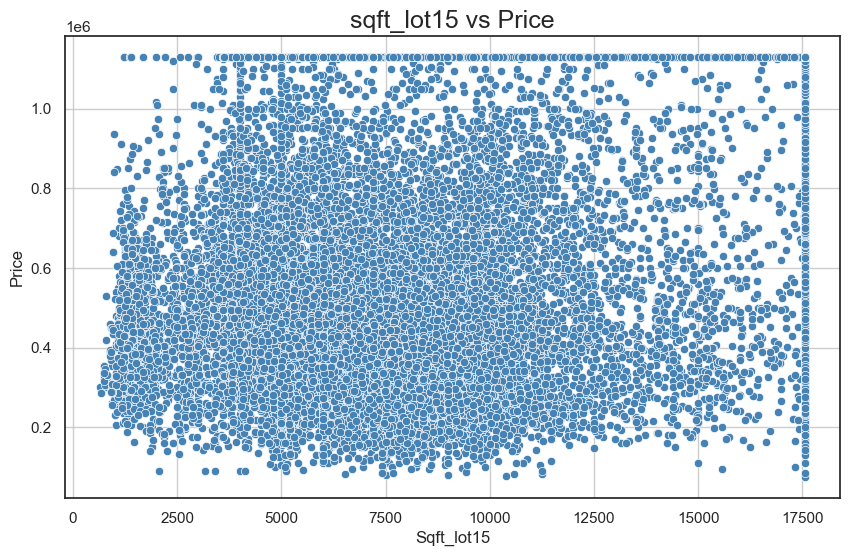

In [88]:
# Numerical
numerical_distplot(df, 'sqft_lot15')
numerical_target_scatterplot(df, 'sqft_lot15')

The lot15 variable shows an extensive distribution pattern comparable to individual property lot size measurements.
The scatterplot reveals a positive connection between price and lot15 size yet some factors from the neighborhood seem to influence the variation.













































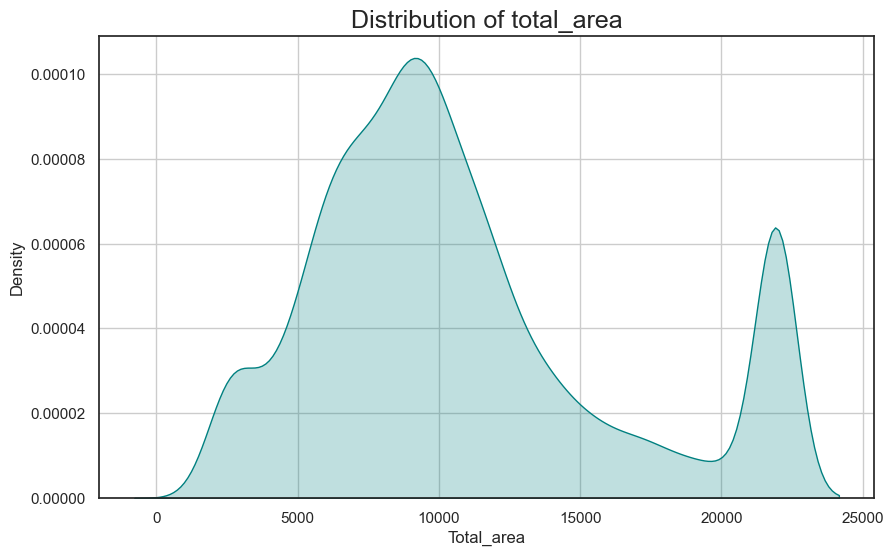

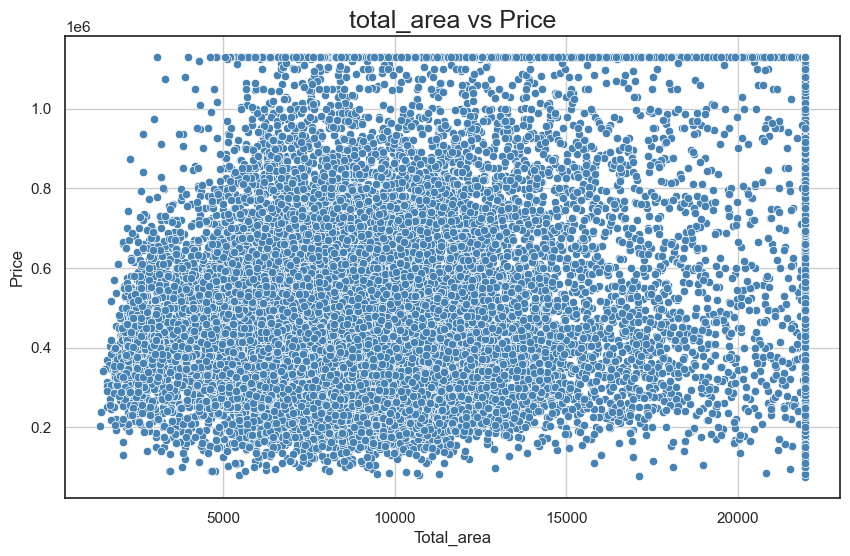

In [90]:
# Numerical
numerical_distplot(df, 'total_area')
numerical_target_scatterplot(df, 'total_area')

The data distribution for combined living and lot areas shows broad distribution with its median value at the center point and a strong visible correlation exists between area size and cost values.


















































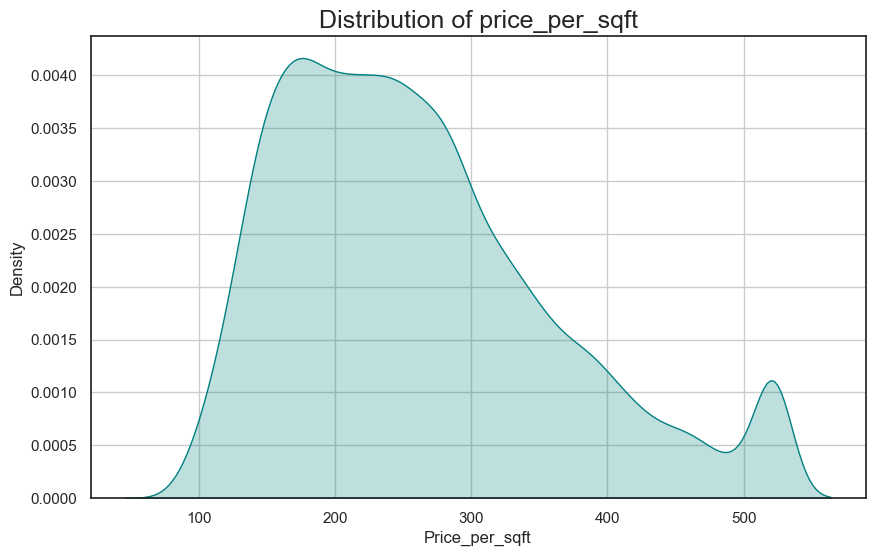

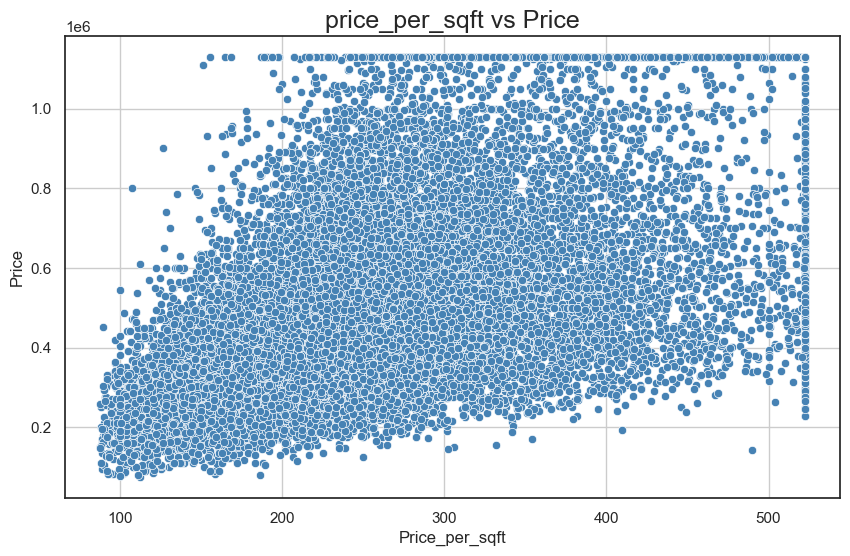

In [92]:
# Numerical
numerical_distplot(df, 'price_per_sqft')
numerical_target_scatterplot(df, 'price_per_sqft')

The price_per_sqft density pattern shows a focused distribution that presents wide variability in its values. Variability in the data points to the fact that price per square foot depends on multiple factors despite the positive relationship shown in the scatterplot.


























































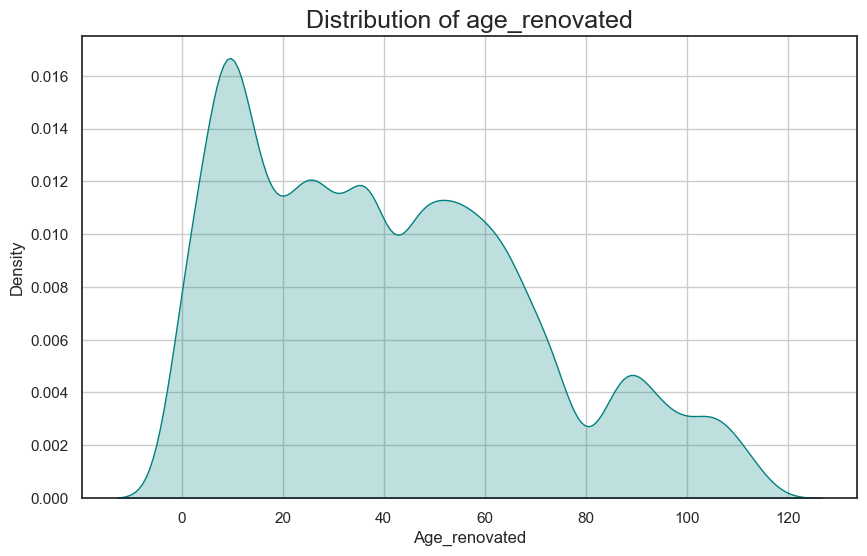

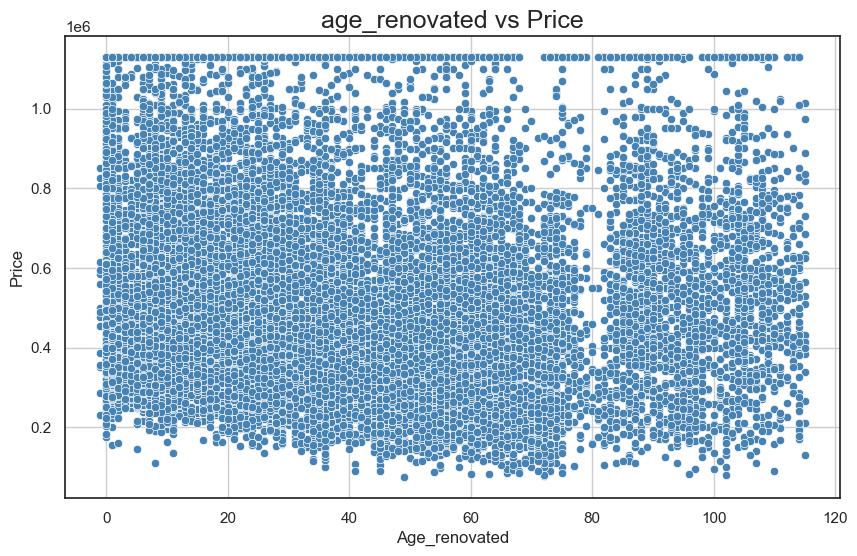

In [94]:
# Numerical
numerical_distplot(df, 'age_renovated')
numerical_target_scatterplot(df, 'age_renovated')

Many properties show a recent renovation pattern or lack of renovation altogether in the age_renovated KDE plot.
 The relationship between these homes' pricing patterns and their recent renovation status shows a weak relationship based on the provided scatterplot.









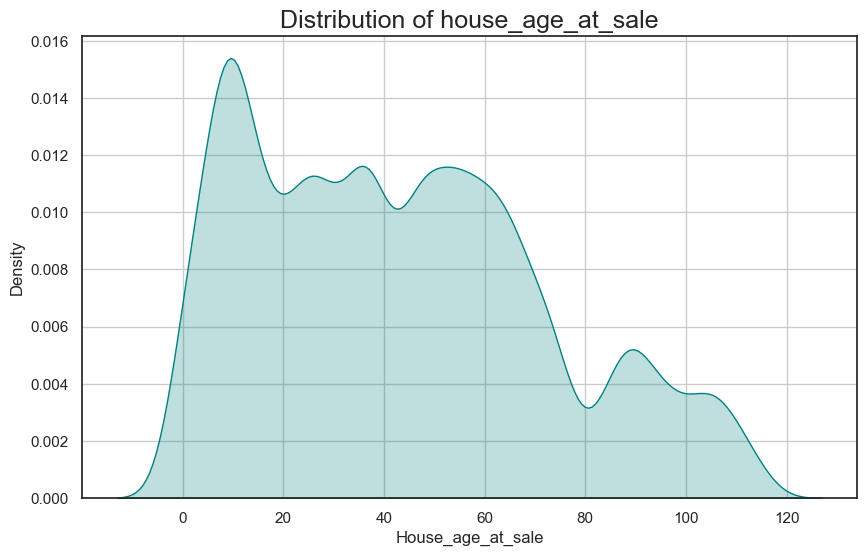

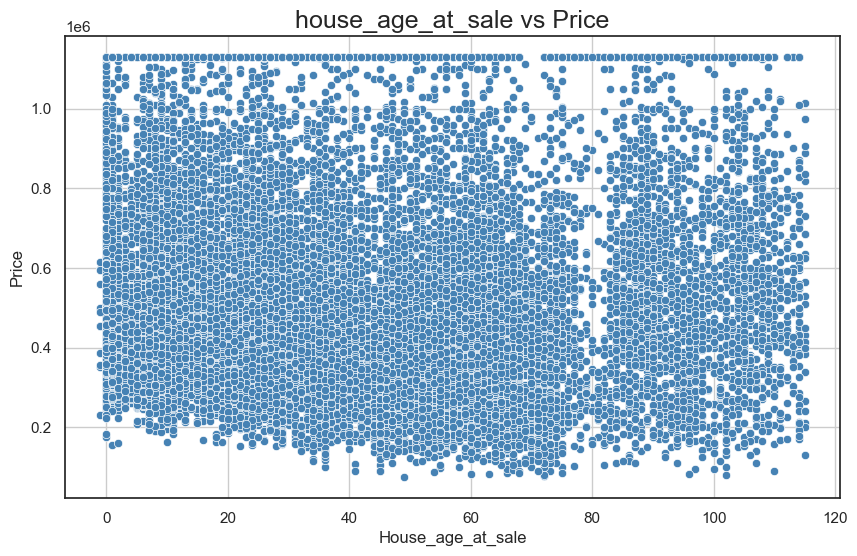

In [96]:
# Numerical
numerical_distplot(df, 'house_age_at_sale')
numerical_target_scatterplot(df, 'house_age_at_sale')

A wide distribution of house_age_at_sale values indicates that properties in various states become available for sale.
 The scatterplot demonstrates that older properties sometimes sell for lower prices but the relationship fails to follow a linear pattern thus various other factors including renovation condition affect house prices.

# Time trends in house prices over the period

In [99]:
#extract year and month of sold date
df['year_sold'] = df['date'].dt.year # extract only year
df['month_sold'] = df['date'].dt.month# extract only month
df['year_sold'] = df['year_sold'].astype(str) #convert year to string
df = df.sort_values('month_sold')

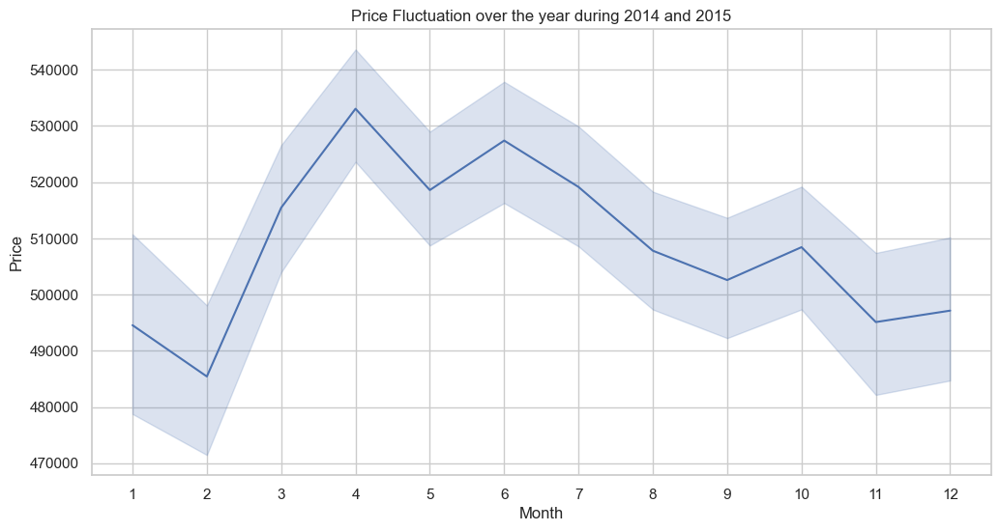

In [100]:
#plotting price fluctuation over the year 
sns.set_theme(style="whitegrid")


# Plot 
plt.figure(figsize=(12, 6))
sns.lineplot(x="month_sold", y="price",
             data=df)
plt.title('Price Fluctuation over the year during 2014 and 2015')
plt.xlabel('Month')
plt.ylabel('Price')

#xtick intervals
plt.xticks(range(1,13))

plt.show()

Price changes are tracked over many months in 2014-2015 to find seasonal trends.The monthly line plots display major average price fluctuations took place in both 2014 and 2015.  Market seasonal patterns exist in pricing due to visible monthly trends which affect costs throughout the year.

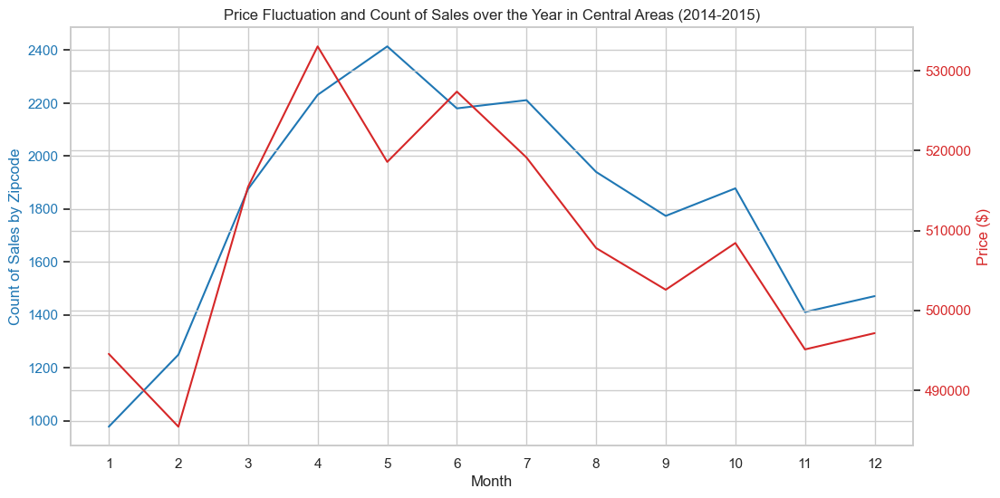

In [102]:

zipcode_sales =df.groupby('month_sold')['zipcode'].count()
price_data =df.groupby('month_sold')['price'].mean()

# Plot
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot count of sales by zipcode
color = 'tab:blue'
ax1.set_xlabel('Month')
ax1.set_ylabel('Count of Sales by Zipcode', color=color)
ax1.plot(zipcode_sales.index, zipcode_sales.values, color=color)
ax1.tick_params(axis='y', labelcolor=color)
#xtick intervals
plt.xticks(range(1,13))

# Create a secondary y-axis for price
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Price ($)', color=color)
ax2.plot(price_data.index, price_data.values, color=color)
ax2.tick_params(axis='y', labelcolor=color)

plt.title('Price Fluctuation and Count of Sales over the Year in Central Areas (2014-2015)')
plt.show()

The dual-axis figure shows two measurement scales with sales numbers per zip code on one side and monthly price averages on the other side. The blue sales count line (sales count) and red pricing line (price).The number of house sales went up from February until April at the same time prices rose. The market prices declined in May although the number of sales stayed at a high level







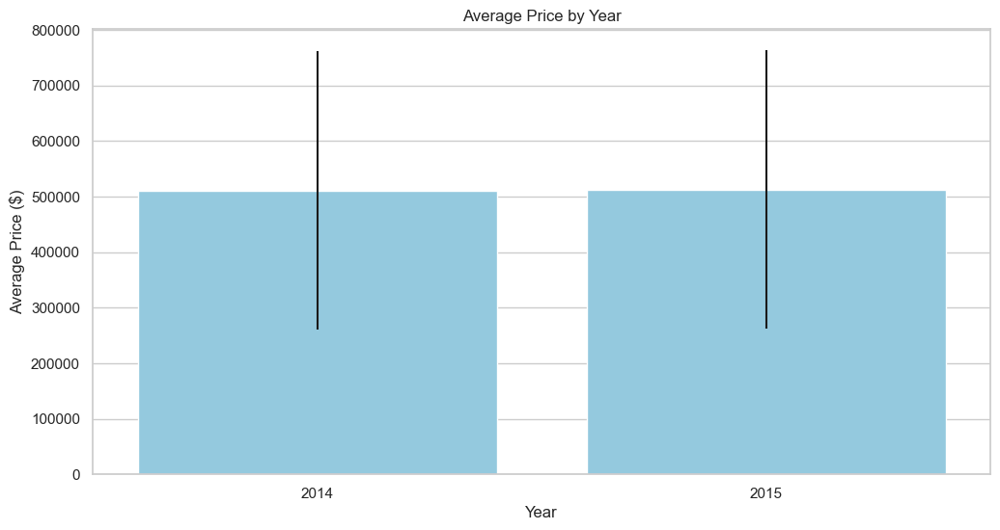

In [104]:
# Calculate average price and standard deviation for each year
average_prices_by_year =df.groupby('year_sold')['price'].agg(['mean', 'std']).reset_index()

# Set the seaborn style
sns.set_theme(style="whitegrid")

# Plot 
plt.figure(figsize=(12, 6))
sns.barplot(x="year_sold", y="mean",
            data=average_prices_by_year, 
            color='skyblue',  # Set color of bars to skyblue
            yerr=average_prices_by_year['std'],  # Set error bars to standard deviation
            capsize=6)  # Set the capsize of error bars

plt.title('Average Price by Year')
plt.xlabel('Year')
plt.ylabel('Average Price ($)')
plt.xticks ([0, 1], ['2014', '2015'])
plt.show()

An additional bar plot illustrates the house price averages from 2014 and 2015 while using standard deviation as error bar indicators.House prices did not increase much from 2014 to 2015.

In [106]:
# Select only numeric columns
df_numeric = df.select_dtypes(include=['float64', 'int64', 'int32'])

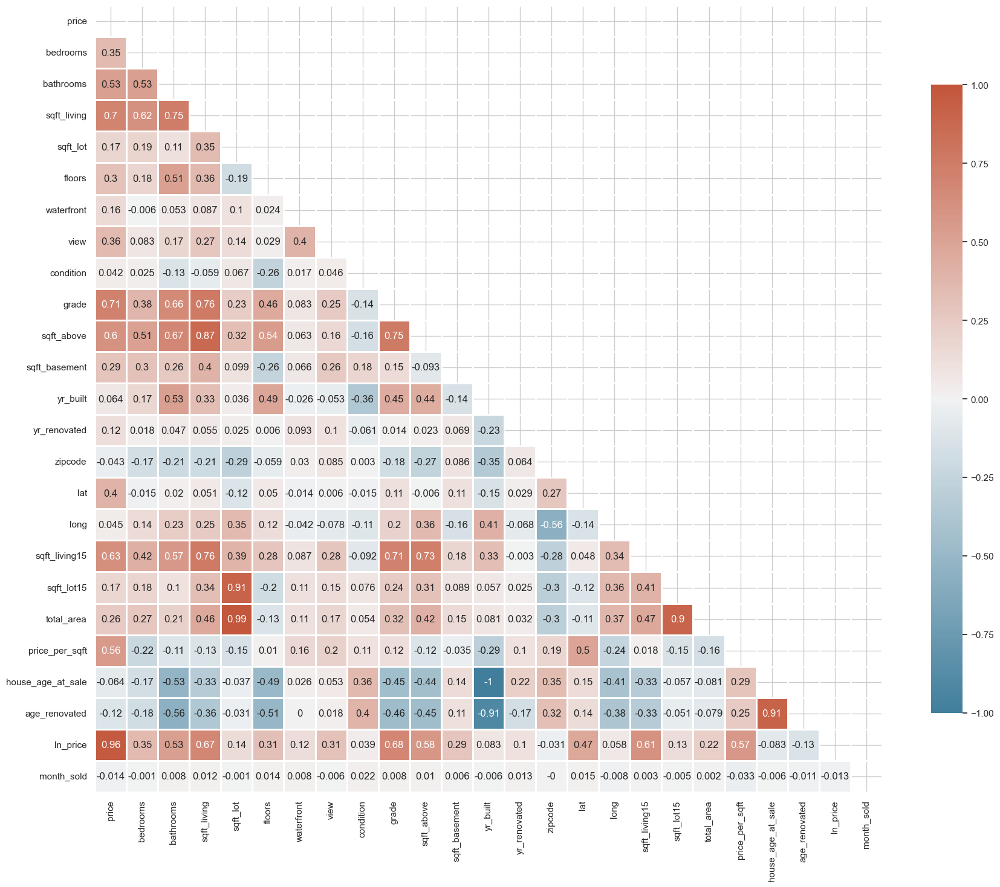

In [107]:
# check for multicolinearity with seaborn heatmap
# compute the correlation matrix
corr = round(df_numeric.corr(), 3)

# generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# set up the matplotlib figure
fig, ax = plt.subplots(figsize=(21, 18))

# generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
ax = sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, vmin=-1, center=0, square=True, linewidths=1, cbar_kws={"shrink": .75}, annot=True)

plt.show();

The heatmap showcases prominent positive correlations between essential features including sqft_living, sqft_above, total_area that may need consideration during feature selection for modeling. The upper triangle masking ensures viewers can analyze the lower half more effectively to detect relationships and possible multicollinearity problems.

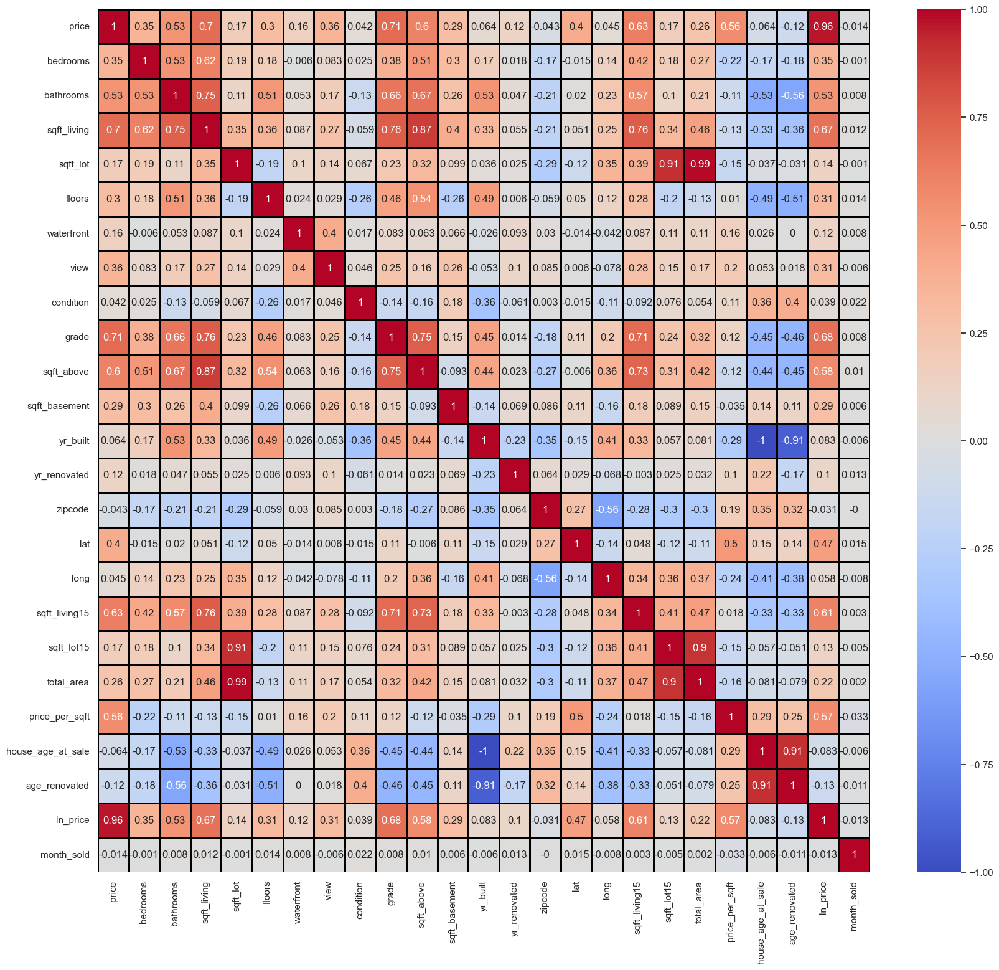

In [109]:
# Correlation Matrix between all variables

corr_matrix = round(df_numeric.corr(), 3)
plt.figure(figsize=(20,18))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linecolor='black', linewidths=1.0, xticklabels=True, yticklabels=True)
plt.show()

The annotated version of this heatmap delivers exact correlation coefficients that validate strong variable relationships involving living area and price parameters. This visualization proves important for understanding predictor overlaps when building models.




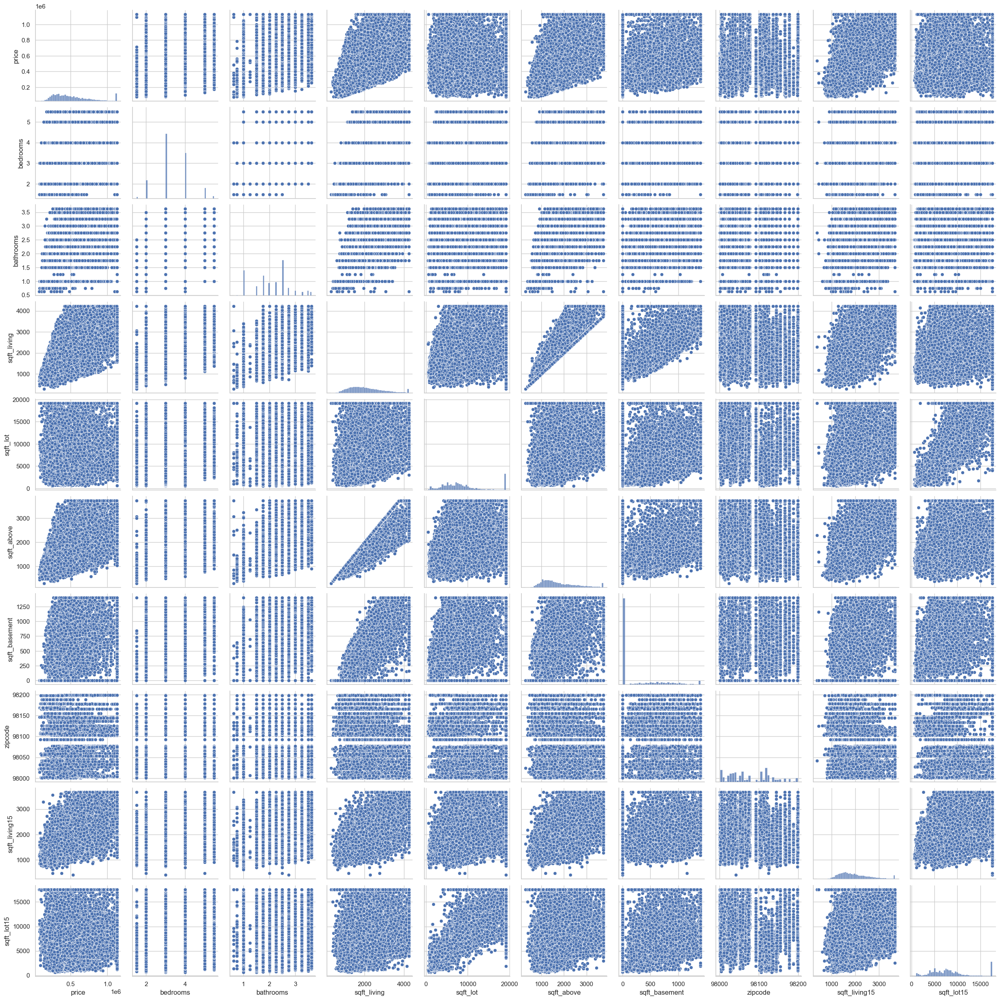

In [111]:
pairplot_df = df[['price','bedrooms','bathrooms','sqft_living','sqft_lot','sqft_above',
                  'sqft_basement', "zipcode","sqft_living15", "sqft_lot15"]]
   
sns.pairplot(pairplot_df)
plt.show()

The pairplot contains scatterplots and histograms for variables including price together with bedrooms and bathrooms and square footage measures and zip codes. Diagonal histograms show individual distributions but off-diagonal plots indicate positive correlations (for instance living area has a positive relationship with price) along with possible non-linear features.











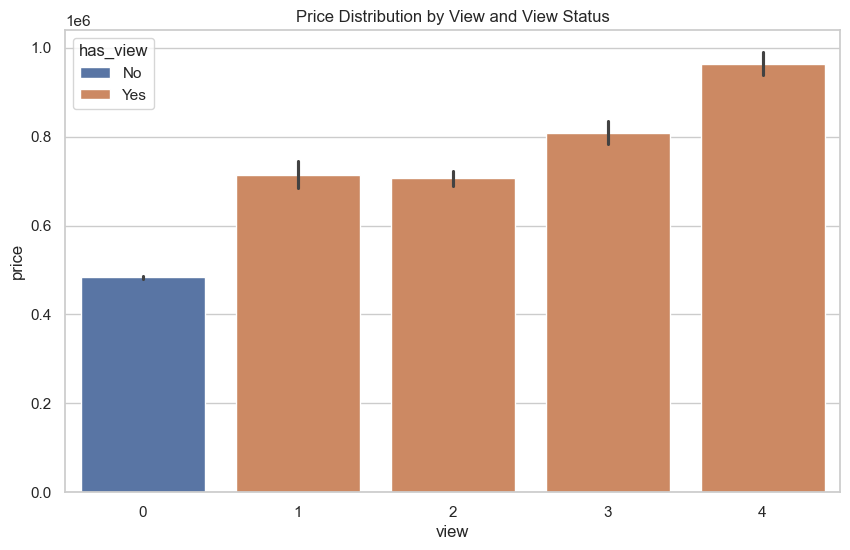

In [113]:

# Example of barplot for price vs 'condition'
plt.figure(figsize=(10, 6))
sns.barplot(x='view', y='price', hue='has_view', data=df)
plt.title('Price Distribution by View and View Status')
plt.show()

The barplot demonstrates that properties classified with a view earn higher prices than those classified without a view. This figure typically shows that hotels with has_view "Yes" tend to get high prices.











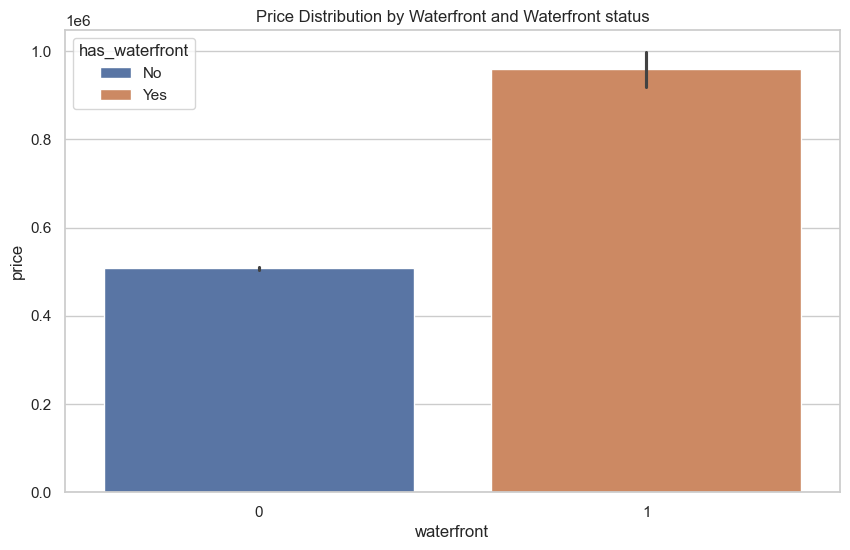

In [115]:

# Example of barplot for price vs 'condition'
plt.figure(figsize=(10, 6))
sns.barplot(x='waterfront', y='price', hue='has_waterfront', data=df)
plt.title('Price Distribution by Waterfront and Waterfront status')
plt.show()

The market value of waterfront homes surpasses non-waterfront houses by a great margin since waterfront access enhances property value.

















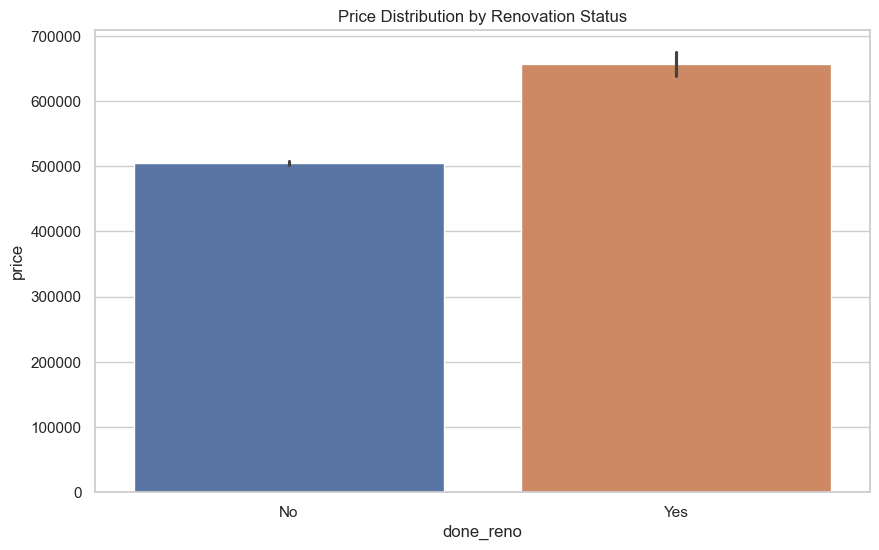

In [117]:

# Example of barplot for price vs 'condition'
plt.figure(figsize=(10, 6))
sns.barplot(x='done_reno', y='price', hue='done_reno', data=df)
plt.title('Price Distribution by Renovation Status')
plt.show()

Renovated houses are more expensive.








In [119]:

# create a base map
basemap = folium.Map(location=[df['lat'].mean(),df['long'].mean()], zoom_start = 9)

# add heatmap
coordinate_copy = df[['lat','long']].copy()
coordinate_copy['count'] = 1
HeatMap(data = coordinate_copy.groupby(['lat','long']).sum().reset_index().values.tolist()
                       , radius=8, max_zoom=13, name='Heat Map').add_to(basemap)
folium.LayerControl(collapsed = False).add_to(basemap) # turn off the heatmap toggle
basemap

# Basic Statistical Analysis

In [121]:
# Calculate the mean, median, and mode for 'price' and 'total_area'
mean_price = df['price'].mean()
median_price = df['price'].median()
mode_price = df['price'].mode()[0]  # mode() returns a series, we take the first value

mean_total_area = df['total_area'].mean()
median_total_area = df['total_area'].median()
mode_total_area = df['total_area'].mode()[0]  # mode() returns a series, we take the first value

print(f"Price - Mean: {mean_price}, Median: {median_price}, Mode: {mode_price}")
print(f"Total Area - Mean: {mean_total_area}, Median: {median_total_area}, Mode: {mode_total_area}")


Price - Mean: 511587.28209873685, Median: 450000.0, Mode: 1129575.0
Total Area - Mean: 10782.717878128904, Median: 9575.0, Mode: 21947.5


A statistical analysis includes calculating the mean, median and mode for both price and total area values.  The differences between these measurements indicate that the data shows skewness.























### Hypothesis t-test

In [124]:
# Bedroom Price Analysis
# Split dataset into two groups based on median bedroom count
median_bedrooms = df['bedrooms'].median()
low_bedroom_group = df[df['bedrooms'] <= median_bedrooms]['price']
high_bedroom_group = df[df['bedrooms'] > median_bedrooms]['price']

# Perform independent t-test for bedrooms
bedroom_t_statistic, bedroom_p_value = stats.ttest_ind(low_bedroom_group, high_bedroom_group,equal_var=False)

In [125]:
# Descriptive statistics and analysis for bedrooms
print("Bedroom Price Analysis:")
print(f"Median Bedroom Count: {median_bedrooms}")
print(f"Low Bedroom Group - Mean Price: ${low_bedroom_group.mean():,.2f}")
print(f"High Bedroom Group - Mean Price: ${high_bedroom_group.mean():,.2f}")
print(f"T-Statistic: {bedroom_t_statistic}")
print(f"P-Value: {bedroom_p_value}")

# Statistical decision for bedrooms
if bedroom_p_value < 0.05:
    print("We reject the null hypothesis.There is a statistically significant difference in prices between low and high bedroom groups.")
else:
    print("We do not reject the null hypothesis. No statistically significant difference in prices based on bedroom count.")

Bedroom Price Analysis:
Median Bedroom Count: 3.0
Low Bedroom Group - Mean Price: $441,287.85
High Bedroom Group - Mean Price: $613,611.95
T-Statistic: -50.41868393557717
P-Value: 0.0
We reject the null hypothesis.There is a statistically significant difference in prices between low and high bedroom groups.


The bedroom feature divided into two groups which separate according to the median number of bedrooms.The mean house prices of houses with fewer bedrooms and more bedrooms undergo comparison through an independent t-test.A p-value falling below 0.05 shows that we should reject the null hypothesis while also indicating that the two groups possess different mean price values.























In [127]:
# Total Area Price Analysis
# Split dataset into two groups based on median total area
median_total_area = df['total_area'].median()
low_area_group = df[df['total_area'] <= median_total_area]['price']
high_area_group = df[df['total_area'] > median_total_area]['price']

# Perform independent t-test for total area
area_t_statistic, area_p_value = stats.ttest_ind(low_area_group, high_area_group,equal_var=False)

In [128]:
# Descriptive statistics and analysis for total area
print("\nTotal Area Price Analysis:")
print(f"Median Total Area: {median_total_area:,.2f} sq ft")
print(f"Low Area Group - Mean Price: ${low_area_group.mean():,.2f}")
print(f"High Area Group - Mean Price: ${high_area_group.mean():,.2f}")
print(f"T-Statistic: {area_t_statistic}")
print(f"P-Value: {area_p_value}")

# Statistical decision for total area
if area_p_value < 0.05:
    print("We reject the null hypothesis. There is a statistically significant difference in prices between small and large total area properties.")
else:
    print("We do not reject the null hypothesis. No statistically significant difference in prices based on total area.")



Total Area Price Analysis:
Median Total Area: 9,575.00 sq ft
Low Area Group - Mean Price: $467,722.31
High Area Group - Mean Price: $555,480.68
T-Statistic: -26.207103917935058
P-Value: 6.78396220678641e-149
We reject the null hypothesis. There is a statistically significant difference in prices between small and large total area properties.


Similarly The total_area feature divides  into two groups which separate according to the median number of total area.The mean house prices of houses with low area and high area group undergo comparison through an independent t-test.A p-value falling below 0.05 shows that we should reject the null hypothesis while also indicating that the two groups possess different mean price values.























The statistical tests verify that the selected features of bedrooms and total area serve as crucial variables in determining house prices.





















